In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Importing all libraries and modules.**

In [ ]:
#importing all the libraries
import pandas as pd
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import re
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms as transforms
import seaborn as sns
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler,RobustScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
from sklearn.feature_selection import mutual_info_classif



**Loading the captions file**

In [ ]:
import pandas as pd

file_path = '/content/drive/MyDrive/ROCO_data/data/train/radiology/captions.txt'

try:
    captions = pd.read_csv(file_path, sep='\t', header=None, names=['image_id', 'caption'])
    print("File loaded successfully!")
    print(captions.head())
except FileNotFoundError:
    print(f"Error: The file at {file_path} was not found.")
except pd.errors.EmptyDataError:
    print("Error: The file is empty.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


File loaded successfully!
     image_id                                            caption
0  ROCO_00002   Computed tomography scan in axial view showin...
1  ROCO_00003   Bacterial contamination occurred after comple...
2  ROCO_00004   The patient had residual paralysis of the han...
3  ROCO_00005      Panoramic radiograph after immediate loading.
4  ROCO_00007   Plain abdomen x-ray: Multiple air levels at t...


**Dataset Overview.**


In [ ]:
print("\n# Dataset Overview")
print(f"Shape of the dataset: {captions.shape}")
print("\nFirst 5 rows:")
print(captions.head())
print("\nColumns:")
print(list(captions.columns))
print("\nData Types:")
print(captions.dtypes)



# Dataset Overview
Shape of the dataset: (65450, 2)

First 5 rows:
     image_id                                            caption
0  ROCO_00002   Computed tomography scan in axial view showin...
1  ROCO_00003   Bacterial contamination occurred after comple...
2  ROCO_00004   The patient had residual paralysis of the han...
3  ROCO_00005      Panoramic radiograph after immediate loading.
4  ROCO_00007   Plain abdomen x-ray: Multiple air levels at t...

Columns:
['image_id', 'caption']

Data Types:
image_id    object
caption     object
dtype: object


**Handling Missing Values**

In [ ]:
print("\n# Missing Values")
missing_values = captions.isnull().sum()
if missing_values.any():
    print("Columns with missing values and their counts:")
    print(missing_values[missing_values > 0])
else:
    print("No missing values found in the dataset.")



# Missing Values
No missing values found in the dataset.


**Visualizing Missing Data**

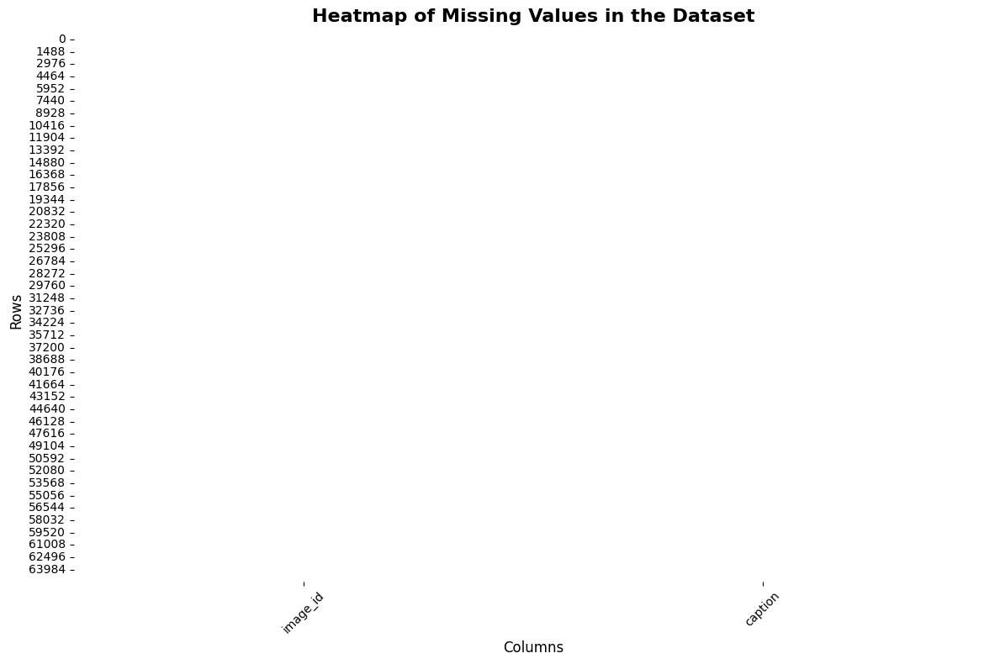

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(captions.isnull(), cbar=False, cmap='viridis', linewidths=0.5, linecolor='white')
plt.title("Heatmap of Missing Values in the Dataset", fontsize=16, fontweight='bold', pad=15)
plt.xlabel("Columns", fontsize=12)
plt.ylabel("Rows", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


**Descriptive Statistics**

In [ ]:

print("\n# Summary Statistics")
if not captions.empty:
    print("\nSummary Statistics for Numeric Columns:")
    print(captions.describe())
    print("\nSummary Statistics for All Columns:")
    print(captions.describe(include='all'))
else:
    print("The dataset is empty. No summary statistics available.")



# Summary Statistics

Summary Statistics for Numeric Columns:
          image_id                         caption
count        65450                           65450
unique       65450                           64772
top     ROCO_00002   Initial panoramic radiograph.
freq             1                              19

Summary Statistics for All Columns:
          image_id                         caption
count        65450                           65450
unique       65450                           64772
top     ROCO_00002   Initial panoramic radiograph.
freq             1                              19



**Descriptive Statistics for the 'caption' Column**

In [ ]:

print("\n# Summary Statistics for 'caption' Column")
if 'caption' in captions.columns:
    if captions['caption'].notnull().any():
        print(captions['caption'].describe())
    else:
        print("The 'caption' column exists but contains only null values.")
else:
    print("The 'caption' column does not exist in the dataset.")



# Summary Statistics for 'caption' Column
count                              65450
unique                             64772
top        Initial panoramic radiograph.
freq                                  19
Name: caption, dtype: object


**Information about the 'caption' Column**

In [ ]:

print("\n# Information about the 'caption' Column")
if 'caption' in captions.columns:
    print(f"Data Type: {captions['caption'].dtype}")
    print(f"Number of Non-Null Values: {captions['caption'].notnull().sum()}")
    print(f"Number of Null Values: {captions['caption'].isnull().sum()}")
    print(f"Unique Values: {captions['caption'].nunique()}")
else:
    print("The 'caption' column does not exist in the dataset.")



# Information about the 'caption' Column
Data Type: object
Number of Non-Null Values: 65450
Number of Null Values: 0
Unique Values: 64772


**Display the Last 10 Rows of the 'caption' Column**

In [ ]:

print("\n# Last 10 Rows of the 'caption' Column")
if 'caption' in captions.columns:
    if not captions['caption'].empty:
        print(captions['caption'].tail(10))
    else:
        print("The 'caption' column exists but is empty.")
else:
    print("The 'caption' column does not exist in the dataset.")



# Last 10 Rows of the 'caption' Column
65440     Coronal CT image demonstrates the duodenum co...
65441     Spino-iliac angle (SIA): lines were drawn alo...
65442     Hinchey stage III. Intravenous and rectal con...
65443     Decompression tube is inserted followed by th...
65444     Doppler ultrasound revealed extensive thrombo...
65445     Initial CT abdomen with contrast showing a di...
65446     44-year-old male patient after surgical amput...
65447     Primary pulmonary tuberculosis in 18-year-old...
65448     MRI brain with gadolinium, coronal view, show...
65449     Contrast-enhanced 3D MRL image of the lower e...
Name: caption, dtype: object


**Value Counts for the 'caption' Column**

In [ ]:

print("\n# Value Counts for the 'caption' Column")
if 'caption' in captions.columns:
    if not captions['caption'].empty:
        print(captions['caption'].value_counts())
    else:
        print("The 'caption' column exists but is empty.")
else:
    print("The 'caption' column does not exist in the dataset.")



# Value Counts for the 'caption' Column
caption
Initial panoramic radiograph.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        19
Preoperative radiograph                                                                                                                                                                                        

**Count of Unique Values in the 'caption' Column**

In [ ]:

print("\n# Count of Unique Values in the 'caption' Column")
if 'caption' in captions.columns:
    unique_count = captions['caption'].nunique()
    print(f"The number of unique captions is: {unique_count}")
else:
    print("The 'caption' column does not exist in the dataset.")



# Count of Unique Values in the 'caption' Column
The number of unique captions is: 64772


**Dropping Duplicates from the 'captions' DataFrame**

In [ ]:

print("\n# Dropping Duplicates from the Dataset")
initial_count = captions.shape[0]
captions.drop_duplicates(inplace=True)
final_count = captions.shape[0]

duplicates_dropped = initial_count - final_count
print(f"Number of duplicates dropped: {duplicates_dropped}")

print("\nUpdated Dataset (First 5 rows):")
print(captions.head())



# Dropping Duplicates from the Dataset
Number of duplicates dropped: 0

Updated Dataset (First 5 rows):
     image_id                                            caption
0  ROCO_00002   Computed tomography scan in axial view showin...
1  ROCO_00003   Bacterial contamination occurred after comple...
2  ROCO_00004   The patient had residual paralysis of the han...
3  ROCO_00005      Panoramic radiograph after immediate loading.
4  ROCO_00007   Plain abdomen x-ray: Multiple air levels at t...


**Statistical Insights on Captions (Length)**

In [ ]:

print("\n# Statistical Insights on Caption Lengths")
if 'caption' in captions.columns:
    caption_lengths = captions['caption'].apply(len)

    mean_length = caption_lengths.mean()
    median_length = caption_lengths.median()
    std_dev_length = caption_lengths.std()

    print(f"Caption Length - Mean: {mean_length:.2f}")
    print(f"Caption Length - Median: {median_length:.2f}")
    print(f"Caption Length - Standard Deviation: {std_dev_length:.2f}")
else:
    print("The 'caption' column does not exist in the dataset.")



# Statistical Insights on Caption Lengths
Caption Length - Mean: 138.96
Caption Length - Median: 114.00
Caption Length - Standard Deviation: 104.24


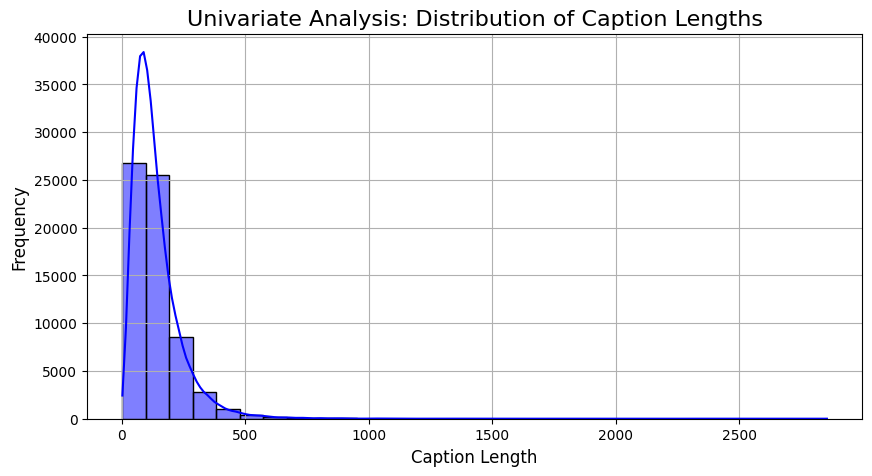


# Statistical Summary of Caption Lengths
Caption Length - Mean: 138.96
Caption Length - Median: 114.00
Caption Length - Standard Deviation: 104.24
Caption Length - Skewness: 3.59
Caption Length - Kurtosis: 36.45
The 'category' column does not exist in the dataset.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew, kurtosis
s
plt.figure(figsize=(10, 5))
sns.histplot(caption_lengths, kde=True, bins=30, color='blue')
plt.title('Univariate Analysis: Distribution of Caption Lengths', fontsize=16)
plt.xlabel('Caption Length', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()
print("\n# Statistical Summary of Caption Lengths")
print(f"Caption Length - Mean: {caption_lengths.mean():.2f}")
print(f"Caption Length - Median: {caption_lengths.median():.2f}")
print(f"Caption Length - Standard Deviation: {caption_lengths.std():.2f}")
print(f"Caption Length - Skewness: {skew(caption_lengths):.2f}")
print(f"Caption Length - Kurtosis: {kurtosis(caption_lengths):.2f}")

if 'category' in captions.columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(x='category', data=captions, palette='Set2')
    plt.title('Univariate Analysis: Category Distribution', fontsize=16)
    plt.xlabel('Category', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()
else:
    print("The 'category' column does not exist in the dataset.")



# Text Data Analysis

Top 10 Most Frequent Words:
showing: 17695
left: 14465
right: 14201
arrow: 12454
ct: 11798
image: 9834
scan: 8239
shows: 7575
tomography: 6771
mass: 6368


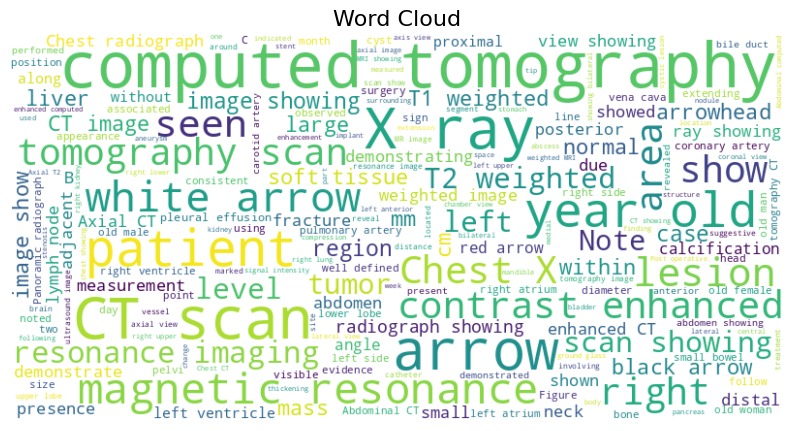

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

if 'caption' in captions.columns:
    print("\n# Text Data Analysis")

    text_data = captions['caption'].dropna()
    vectorizer = CountVectorizer(stop_words='english')
    word_counts = vectorizer.fit_transform(text_data)
    word_counts_sum = word_counts.sum(axis=0)

    words = vectorizer.get_feature_names_out()
    word_freq = [(word, word_counts_sum[0, idx]) for word, idx in zip(words, range(len(words)))]
    word_freq = sorted(word_freq, key=lambda x: x[1], reverse=True)


    print("\nTop 10 Most Frequent Words:")
    for word, freq in word_freq[:10]:
        print(f"{word}: {freq}")


    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(text_data))

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Word Cloud", fontsize=16)
    plt.show()
else:
    print("The 'caption' column does not exist in the dataset.")



# Clustering Captions


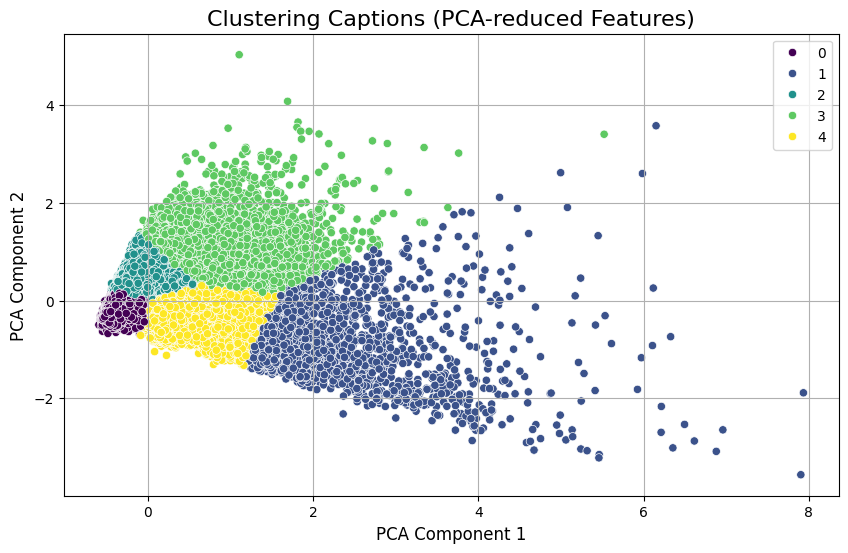

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Clustering Captions
if 'caption' in captions.columns:
    print("\n# Clustering Captions")

    vectorizer = CountVectorizer(max_features=1000, stop_words='english')
    caption_features = vectorizer.fit_transform(captions['caption'])

    pca = PCA(n_components=2)
    reduced_features = pca.fit_transform(caption_features.toarray())


    kmeans = KMeans(n_clusters=5, random_state=42)
    clusters = kmeans.fit_predict(reduced_features)


    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=clusters, palette='viridis', legend='full')
    plt.title('Clustering Captions (PCA-reduced Features)', fontsize=16)
    plt.xlabel('PCA Component 1', fontsize=12)
    plt.ylabel('PCA Component 2', fontsize=12)
    plt.grid(True)
    plt.show()
else:
    print("The 'caption' column does not exist in the dataset.")


Calculate Caption Length and Add as a New Column

In [ ]:

base_dir = '/content/drive/MyDrive/ROCO_data/data'
splits = ['train', 'test', 'validation']
categories = ['radiology', 'non-radiology']

data = []
for split in splits:
    for category in categories:
        category_dir = os.path.join(base_dir, split, category)
        captions_file = os.path.join(category_dir, 'captions.txt')

        if os.path.exists(captions_file):
            with open(captions_file, 'r', encoding='utf-8', errors='ignore') as file:
                for line in file:
                    image_id = line[:12]
                    caption = line[12:].strip()
                    label = category
                    data.append([image_id, caption, label, split])

df = pd.DataFrame(data, columns=['image_id', 'caption', 'label', 'split'])
df

,image_id,caption,label,split
0,ROCO_00002\t,Computed tomography scan in axial view showing...,radiology,train
1,ROCO_00003\t,Bacterial contamination occurred after complet...,radiology,train
2,ROCO_00004\t,The patient had residual paralysis of the hand...,radiology,train
3,ROCO_00005\t,Panoramic radiograph after immediate loading.,radiology,train
4,ROCO_00007\t,Plain abdomen x-ray: Multiple air levels at th...,radiology,train
...,...,...,...,...
87922,ROCO_87894\t,Scanning electron photomicrograph of blood cel...,non-radiology,validation
87923,ROCO_87904\t,SEM of Solenopsis elhawagryi sp. n. minor work...,non-radiology,validation
87924,ROCO_87918\t,Under visualization through the anterolateral ...,non-radiology,validation
87925,ROCO_87936\t,The endoscopic view demonstrated progressive d...,non-radiology,validation


In [ ]:

if 'caption' in df.columns:
    df['caption_length'] = df['caption'].str.len()
    print("\n# Caption Length Column Added")
    print(df[['caption', 'caption_length']].head())
else:
    print("The 'caption' column does not exist in the DataFrame.")



# Caption Length Column Added
                                             caption  caption_length
0  Computed tomography scan in axial view showing...              87
1  Bacterial contamination occurred after complet...             141
2  The patient had residual paralysis of the hand...             319
3      Panoramic radiograph after immediate loading.              45
4  Plain abdomen x-ray: Multiple air levels at th...             123


In [ ]:
sample_df = pd.DataFrame(data)
sample_df.head(5)

,0,1,2,3
0,ROCO_00002\t,Computed tomography scan in axial view showing...,radiology,train
1,ROCO_00003\t,Bacterial contamination occurred after complet...,radiology,train
2,ROCO_00004\t,The patient had residual paralysis of the hand...,radiology,train
3,ROCO_00005\t,Panoramic radiograph after immediate loading.,radiology,train
4,ROCO_00007\t,Plain abdomen x-ray: Multiple air levels at th...,radiology,train


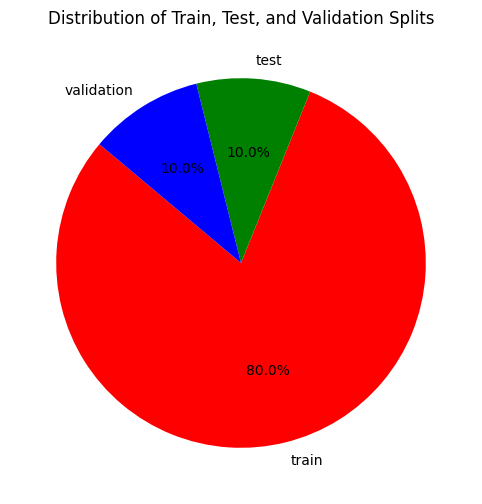

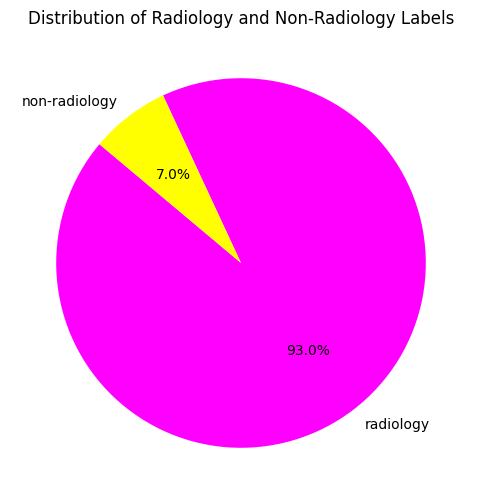

In [ ]:
import matplotlib.pyplot as plt

split_counts = df['split'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(split_counts, labels=split_counts.index, autopct='%1.1f%%', startangle=140, colors=['red', 'green', 'blue'])
plt.title("Distribution of Train, Test, and Validation Splits")
plt.show()

label_counts = df['label'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140, colors=['magenta', 'yellow'])
plt.title("Distribution of Radiology and Non-Radiology Labels")
plt.show()


# Image Data Analysis 
Number of images: 65420


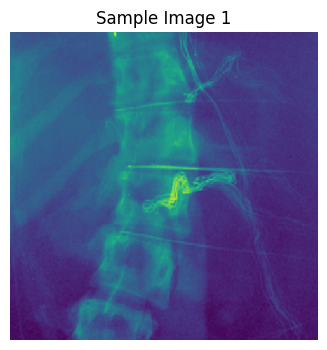

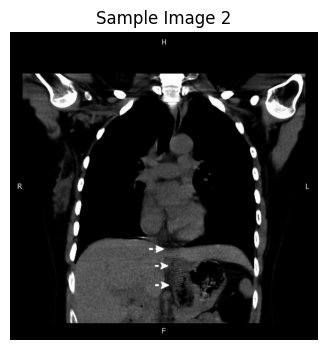

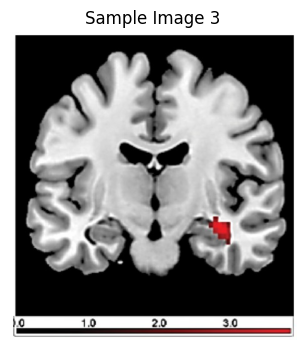

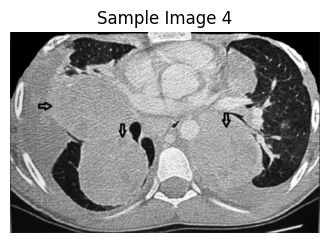

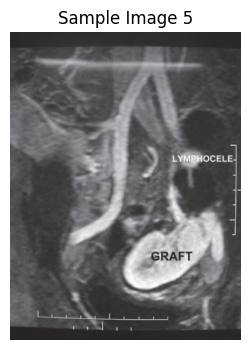

In [ ]:
image_folder = '/content/drive/MyDrive/ROCO_data/data/train/radiology/images'
if os.path.exists(image_folder):
    print("\n# Image Data Analysis ")
    image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Number of images: {len(image_files)}")

    # Display Sample Images
    for i, image_file in enumerate(image_files[:5]):
        img = Image.open(image_file)
        plt.figure(figsize=(4, 4))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Sample Image {i+1}")
        plt.show()





Displaying a batch from train_loader:


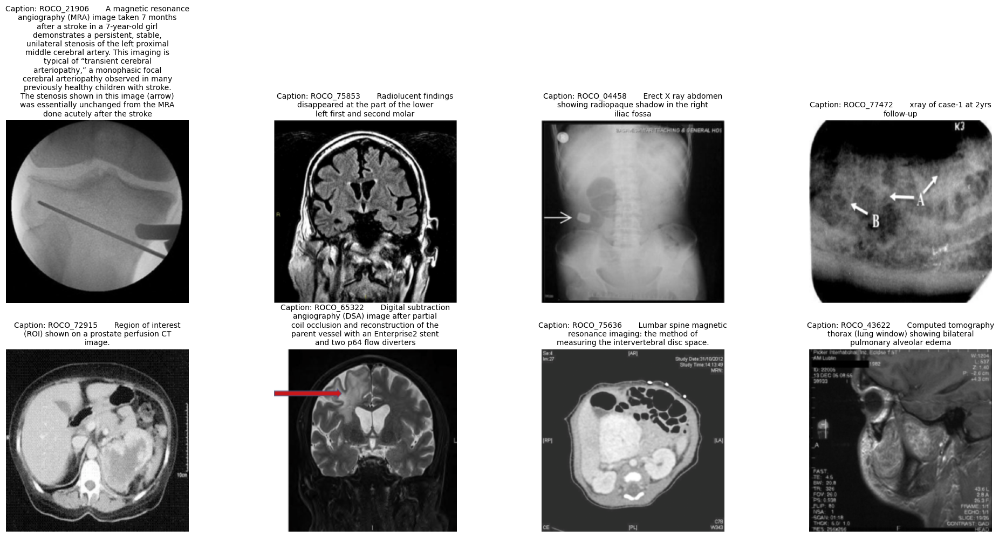

In [ ]:

import os
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import textwrap

class RocoDataset(Dataset):
    def __init__(self, image_dir, caption_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        with open(caption_file, 'r') as f:
            self.captions = f.readlines()

        self.image_filenames = sorted(os.listdir(image_dir))
    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_filenames[idx])
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)
        caption = self.captions[idx].strip()
        return image, caption

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_dir = '/content/drive/MyDrive/ROCO_data/data/train/radiology/images'
caption_file = '/content/drive/MyDrive/ROCO_data/data/train/radiology/captions.txt'
roco_dataset = RocoDataset(image_dir, caption_file, transform=transform)
train_loader = DataLoader(roco_dataset, batch_size=8, shuffle=True)

def denormalize_image(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    tensor = tensor * std[:, None, None] + mean[:, None, None]
    return tensor.permute(1, 2, 0).clamp(0, 1).numpy()

def show_batch_images(data_loader):
    data_iter = iter(data_loader)
    images, captions = next(data_iter)

    num_images = images.shape[0]
    cols = 4
    rows = (num_images // cols) + (num_images % cols > 0)

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, rows * 5))
    axes = axes.flatten()

    for i in range(num_images):
        image = denormalize_image(images[i])
        axes[i].imshow(image)
        wrapped_caption = textwrap.fill(captions[i], width=40)
        axes[i].set_title(f"Caption: {wrapped_caption}", fontsize=10)
        axes[i].axis('off')

    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

print("Displaying a batch from train_loader:")
show_batch_images(train_loader)


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

In [ ]:
base_model=VGG16(weights="imagenet")


553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


In [ ]:
from tensorflow.keras.preprocessing import image
model=Model(inputs=base_model.input,outputs=base_model.get_layer("block5_conv3").output)

In [ ]:
def load_and_preprocess_image(img_path,target_size=(224,224)):
  img=image.load_img('/content/drive/MyDrive/ROCO_data/data/train/radiology/images/ROCO_81800.jpg',target_size=target_size)
  img_array=image.img_to_array(img)
  img_array=np.expand_dims(img_array,axis=0)
  img_array=preprocess_input(img_array)
  return img_array

In [ ]:
img=image.load_img('/content/drive/MyDrive/ROCO_data/data/train/radiology/images/ROCO_81800.jpg',target_size=(224,224))
img_array=image.img_to_array(img)

In [ ]:
img_array.shape


(224, 224, 3)

In [ ]:
img_array=np.expand_dims(img_array,axis=0)
img_array.shape

(1, 224, 224, 3)

In [ ]:
feature_maps=model.predict(img_array)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [ ]:
n_features=feature_maps.shape[-1]
n_features

512

In [ ]:
size=feature_maps.shape[1]
from PIL import Image


In [ ]:
img_path='/content/drive/MyDrive/ROCO_data/data/train/radiology/images/ROCO_81808.jpg'
img=Image.open(img_path)
img.size

(406, 468)

In [ ]:
display_grid=np.zeros((size,size*n_features))
display_grid

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
for i in range(n_features):
  x=feature_maps[0,:,:,i]
  x-=x.mean()
  x/=(x.std()+1e-5)
  x*=64
  x+=128
  x=np.clip(x,0,255).astype(int)
  display_grid[:,i*size:(i+1)*size]=x

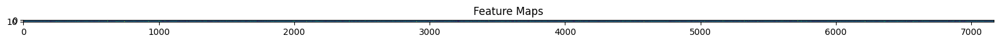

In [ ]:
scale=20./n_features
plt.figure(figsize=(scale*n_features,scale))
plt.title("Feature Maps")
plt.grid(False)
plt.imshow(display_grid,aspect="auto")

Feature map shape: (1, 14, 14, 512)


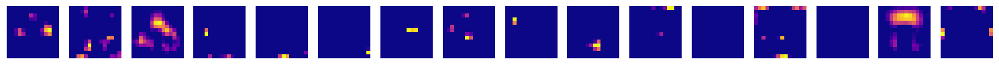

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

def plot_feature_maps(feature_maps, num_channels=16, figsize=(20, 20), colormap='viridis'):
    channels = feature_maps.shape[-1]
    num_channels = min(num_channels, channels)
    fig, axes = plt.subplots(1, num_channels, figsize=figsize)
    for i in range(num_channels):
        ax = axes[i]
        ax.imshow(feature_maps[0, :, :, i], cmap=colormap)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

print(f"Feature map shape: {feature_maps.shape}")
plot_feature_maps(feature_maps, num_channels=16, figsize=(15, 10), colormap='plasma')

 ANN

In [ ]:
df

,image_id,caption,label,split,caption_length
0,ROCO_00002\t,Computed tomography scan in axial view showing...,radiology,train,87
1,ROCO_00003\t,Bacterial contamination occurred after complet...,radiology,train,141
2,ROCO_00004\t,The patient had residual paralysis of the hand...,radiology,train,319
3,ROCO_00005\t,Panoramic radiograph after immediate loading.,radiology,train,45
4,ROCO_00007\t,Plain abdomen x-ray: Multiple air levels at th...,radiology,train,123
...,...,...,...,...,...
87922,ROCO_87894\t,Scanning electron photomicrograph of blood cel...,non-radiology,validation,111
87923,ROCO_87904\t,SEM of Solenopsis elhawagryi sp. n. minor work...,non-radiology,validation,73
87924,ROCO_87918\t,Under visualization through the anterolateral ...,non-radiology,validation,303
87925,ROCO_87936\t,The endoscopic view demonstrated progressive d...,non-radiology,validation,84


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf=TfidfVectorizer(max_features=1000)
X=tfidf.fit_transform(df['caption']).toarray()
y=df['label']
X
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

**Split into Train, Validation, and Test Sets**

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from keras.callbacks import EarlyStopping
import numpy as np

# tfidf the caption and create our X and y variables.
tfidf = TfidfVectorizer(max_features=1000)
X = tfidf.fit_transform(df['caption']).toarray()
y = df['label']

# Label encode y variable.
le = LabelEncoder()
y = le.fit_transform(y)

# Split the dataset into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Define the model
model = Sequential([
    Dense(128, activation='relu', kernel_regularizer=l2(0.01), input_shape=(X.shape[1],)),  # Increased units
    Dropout(0.5),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),  # Increased units
    Dropout(0.4),  # Adjusted dropout rate
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val),
                    callbacks=[early_stopping])

# Evaluate the model and get the loss and accuracy
test_loss, test_accuracy = model.evaluate(X_test, y_test)

# Print the loss and accuracy
print(f"Test Loss: {test_loss * 100:.2f}%") # access the value from model evaluate
print(f"Test Accuracy: {test_accuracy * 100:.2f}%") # access the value from model evaluate

# Display evaluation metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")  # Get binary predictions

# Display evaluation metrics
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

# Get the last recorded training loss and accuracy
last_train_loss = history.history['loss'][-1]
last_train_accuracy = history.history['accuracy'][-1]

print(f"Final Training Loss: {last_train_loss * 100:.2f}%") # access the value from history
print(f"Final Training Accuracy: {last_train_accuracy * 100:.2f}%")# access the value from history

# ROC-AUC Score
roc_auc = roc_auc_score(y_test, model.predict(X_test))
print(f"ROC-AUC Score: {roc_auc:.4f}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - accuracy: 0.9202 - loss: 0.5487 - val_accuracy: 0.9305 - val_loss: 0.2553
Epoch 2/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - accuracy: 0.9302 - loss: 0.2597 - val_accuracy: 0.9305 - val_loss: 0.2537
Epoch 3/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 21s 11ms/step - accuracy: 0.9313 - loss: 0.2559 - val_accuracy: 0.9305 - val_loss: 0.2530
Epoch 4/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 38s 10ms/step - accuracy: 0.9307 - loss: 0.2565 - val_accuracy: 0.9305 - val_loss: 0.2525
Epoch 5/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 21s 11ms/step - accuracy: 0.9300 - loss: 0.2573 - val_accuracy: 0.9305 - val_loss: 0.2525
Epoch 6/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 40s 10ms/step - accuracy: 0.9299 - loss: 0.2567 - val_accuracy: 0.9305 - val_loss: 0.2524
Epoch 7/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 19s 10ms/step - accuracy: 0.9301 - loss: 0.2560 - val_accuracy: 0.9305 - val_loss: 0.2527
Epoch 8/50
1924/1924 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - accuracy: 0.9309 -

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       918
           1       0.93      1.00      0.96     12272

    accuracy                           0.93     13190
   macro avg       0.47      0.50      0.48     13190
weighted avg       0.87      0.93      0.90     13190

Accuracy Score: 0.9304018195602729
Final Training Loss: 25.37%
Final Training Accuracy: 93.04%
413/413 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
ROC-AUC Score: 0.5000


In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Embedding, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.models import Model

In [ ]:
file_path = '/content/drive/MyDrive/ROCO_data/data/train/radiology/captions.txt'
with open(file_path, 'r') as file:
    captions = file.readlines()

In [ ]:
corpus = [caption.strip() for caption in captions[:300] if caption.strip()]
tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

Vocabulary size: 2187


In [ ]:
# Create sequences from the corpus
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i+1]
        sequences.append(ngram_sequence)

In [ ]:
# Find the maximum sequence length
max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

In [ ]:
X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dropout, Dense, Bidirectional
from keras.optimizers import Adam, RMSprop

# Function to build the model with hyperparameters
def build_model(vocab_size, max_sequence_len, embedding_dim=50, lstm_units=100,
                dropout_rate=0.2, optimizer='adam', learning_rate=0.001,
                output_units=None, output_activation='softmax', bidirectional=False):
    """
    Builds an LSTM model with specified hyperparameters.

    Parameters:
    - vocab_size (int): Size of the vocabulary (number of unique tokens).
    - max_sequence_len (int): Maximum length of input sequences.
    - embedding_dim (int): Dimension of the embedding layer.
    - lstm_units (int): Number of LSTM units.
    - dropout_rate (float): Dropout rate to prevent overfitting.
    - optimizer (str): Optimizer to use ('adam' or 'rmsprop').
    - learning_rate (float): Learning rate for the optimizer.
    - output_units (int): Number of units in the output layer. Defaults to vocab_size for multi-class.
    - output_activation (str): Activation function for the output layer ('softmax' or 'sigmoid').
    - bidirectional (bool): Whether to use a bidirectional LSTM.

    Returns:
    - model (keras.Model): Compiled LSTM model.
    """

    # Select optimizer with specified learning rate
    if optimizer == 'adam':
        selected_optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        selected_optimizer = RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam' or 'rmsprop'.")

    # Build the model
    model = Sequential()

    # Embedding layer
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_len-1))

    # LSTM layer (Bidirectional if specified)
    if bidirectional:
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=False)))
    else:
        model.add(LSTM(lstm_units, return_sequences=False))

    # Dropout layer
    model.add(Dropout(dropout_rate))

    # Output layer
    if output_units is None:
        output_units = vocab_size  # Default for multi-class classification
    model.add(Dense(output_units, activation=output_activation))

    # Compile the model
    model.compile(loss="categorical_crossentropy" if output_activation == 'softmax' else 'binary_crossentropy',
                  optimizer=selected_optimizer,
                  metrics=['accuracy'])

    return model


In [ ]:

# Define hyperparameters
hyperparameters = {
    "embedding_dim": 100,  # Dimension of embedding vector
    "lstm_units": 128,     # Number of LSTM units
    "dropout_rate": 0.3,   # Dropout rate
    "optimizer": 'adam',   # Optimizer type ('adam' or 'rmsprop')
    "learning_rate": 0.001 # Learning rate
}

In [ ]:
from keras.models import Model
from keras.layers import Input, Embedding, LSTM, Bidirectional, BatchNormalization, Dense, Dropout
from keras.optimizers import Adam

# Build model function
def build_model(embedding_dim, lstm_units, dropout_rate, optimizer='adam', learning_rate=0.001, input_shape=(None,), dense_units=128):
    """
    Builds an improved LSTM model with specified hyperparameters.

    Parameters:
    - embedding_dim (int): Dimension of the embedding layer.
    - lstm_units (int): Number of LSTM units in the Bidirectional LSTM layer.
    - dropout_rate (float): Dropout rate to prevent overfitting.
    - optimizer (str): Optimizer to use ('adam' by default).
    - learning_rate (float): Learning rate for the optimizer.
    - input_shape (tuple): Shape of the input data (default is (None,)).
    - dense_units (int): Number of units in the Dense layer (default is 128).

    Returns:
    - model (keras.Model): Compiled LSTM model.
    """

    # Input layer
    inputs = Input(shape=input_shape, name="input_layer")

    # Embedding layer
    x = Embedding(input_dim=5000, output_dim=embedding_dim, name="embedding_layer")(inputs)

    # Bidirectional LSTM
    x = Bidirectional(LSTM(units=lstm_units, return_sequences=False, dropout=dropout_rate), name="bi_lstm")(x)

    # Batch Normalization
    x = BatchNormalization(name="batch_norm")(x)

    # Dense layer
    x = Dense(units=dense_units, activation='relu', name="dense_layer")(x)

    # Dropout layer
    x = Dropout(rate=dropout_rate, name="dropout_layer")(x)

    # Multi-class output layer
    outputs = Dense(units=2187, activation='softmax', name="output_layer")(x)

    # Model definition
    model = Model(inputs=inputs, outputs=outputs, name="improved_lstm_model")

    # Optimizer with gradient clipping
    if optimizer == 'adam':
        optimizer = Adam(learning_rate=learning_rate, clipnorm=1.0)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam'.")

    # Compile model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Build the updated model using hyperparameters from a dictionary
model = build_model(
    embedding_dim=hyperparameters['embedding_dim'],
    lstm_units=hyperparameters['lstm_units'],
    dropout_rate=hyperparameters['dropout_rate'],
    optimizer=hyperparameters['optimizer'],
    learning_rate=hyperparameters['learning_rate']
)

# Model summary
model.summary()


Model: "improved_lstm_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ embedding_layer (Embedding)          │ (None, None, 100)           │         500,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bi_lstm (Bidirectional)              │ (None, 256)                 │         234,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_norm (BatchNormalization)      │ (None, 256)                 │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_layer (Dense)                  │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_layer (Dropout)              │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 2187)                │         282,123 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,050,539 (4.01 MB)

 Trainable params: 1,050,027 (4.01 MB)

 Non-trainable params: 512 (2.00 KB)


Training Model:
Epoch 1/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 77s 451ms/step - accuracy: 0.0394 - loss: 7.2129 - val_accuracy: 0.0685 - val_loss: 6.9468
Epoch 2/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 69s 434ms/step - accuracy: 0.0723 - loss: 6.1821 - val_accuracy: 0.0748 - val_loss: 6.9082
Epoch 3/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 431ms/step - accuracy: 0.0962 - loss: 5.7111 - val_accuracy: 0.0780 - val_loss: 6.9789
Epoch 4/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 88s 468ms/step - accuracy: 0.1091 - loss: 5.3899 - val_accuracy: 0.0976 - val_loss: 7.7246
Epoch 5/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 459ms/step - accuracy: 0.1523 - loss: 5.0399 - val_accuracy: 0.1047 - val_loss: 8.2629
Epoch 6/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 69s 434ms/step - accuracy: 0.1838 - loss: 4.6664 - val_accuracy: 0.1142 - val_loss: 8.2147
Epoch 7/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 70s 439ms/step - accuracy: 0.2267 - loss: 4.3106 - val_accuracy: 0.1189 - val_loss: 9.8060
Epoch 8/100
159/159 ━━━━━━━━━━━━━━━━━━━━ 70s 436ms/step - a

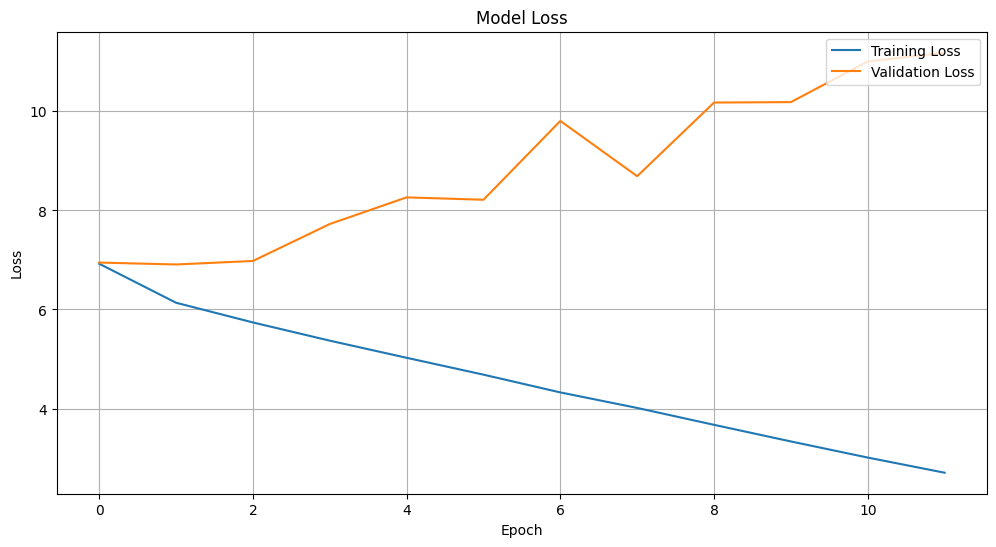

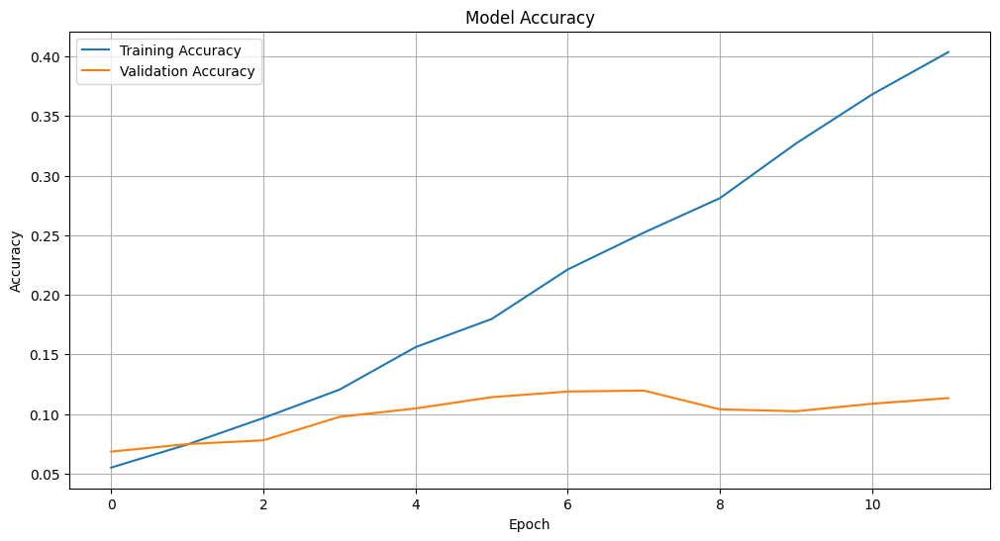

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Define early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Define a model checkpoint to save the best model with the correct file extension
model_checkpoint = ModelCheckpoint(
    'best_model.keras',  # Changed to .keras extension
    monitor='val_loss',
    save_best_only=True,
    mode='min'
)

# Train the model and capture the history
print("\nTraining Model:")
history = model.fit(
    X,
    y,
    epochs=100,
    verbose=1,
    batch_size=32,
    validation_split=0.2,  # Use 20% of data for validation
    callbacks=[early_stopping, model_checkpoint]  # Include callbacks
)

# Optionally plot the training history
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid()
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid()
plt.show()


In [ ]:
final_accuracy = history.history['accuracy'][-1]  # Get the final accuracy from the history
print(f"\ Accuracy : {final_accuracy*100}")

\ Accuracy : 60.99625825881958


**Classification report of LSTM**

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Predict the classes for the training data
y_pred = np.argmax(model.predict(X), axis=-1)  # Convert softmax probabilities to class indices
y_true = np.argmax(y, axis=-1)  # Convert one-hot encoded true labels to class indices

# Get the unique class labels from y_true
labels = np.unique(y_true)

# Filter target_names to match the labels
target_names = [tokenizer.index_word.get(label, str(label)) for label in labels]


# Generate the classification report using the filtered target_names and labels
report = classification_report(y_true, y_pred, labels=labels, target_names=target_names)
print("\nClassification Report:\n")
print(report)

199/199 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step

Classification Report:

                     precision    recall  f1-score   support

                the       0.11      0.91      0.20       397
                 of       0.05      0.51      0.08       276
                and       0.00      0.00      0.00       128
                  a       0.00      0.00      0.00       123
               with       0.00      0.00      0.00       119
                 in       0.00      0.00      0.00       116
            showing       0.00      0.00      0.00        91
              right       0.00      0.00      0.00        66
              arrow       0.00      0.00      0.00        55
                 ct       0.00      0.00      0.00        53
               left       0.00      0.00      0.00        52
              image       0.00      0.00      0.00        47
                 to       0.00      0.00      0.00        44
              shows       0.00      0.00      0.00        41
               

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


**HYPERPARAMETER TUNING**

**Randomized search**

In [ ]:
from sklearn.model_selection import ParameterSampler, train_test_split
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np

# Define the hyperparameter space
param_space = {
    "embedding_dim": [50, 100, 150],
    "lstm_units": [64, 128, 256],
    "dropout_rate": [0.2, 0.3, 0.5],
    "optimizer": ['adam', 'rmsprop'],
    "learning_rate": [0.001, 0.005, 0.01]
}

# Randomized search configuration
n_iter = 10  # Number of random combinations to try
param_combinations = list(ParameterSampler(param_space, n_iter=n_iter, random_state=42))

# Ensure X and y are preprocessed correctly (replace X, y with actual data)
# Example: Ensure X is 2D and y is 1D
assert len(X) == len(y), "Mismatch in the number of samples between X and y."

# Splitting data into training and validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Verify and log shapes for debugging
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")

# Reshape target labels for binary classification (if necessary)
if len(y_train.shape) == 1:
    y_train = y_train.reshape(-1, 1)
    y_val = y_val.reshape(-1, 1)

# Initialize tracking variables
best_accuracy = 0
best_params = None
best_model = None

# Function to build the model
def build_model(embedding_dim, lstm_units, dropout_rate, optimizer, learning_rate):
    from tensorflow.keras import Sequential
    from tensorflow.keras.layers import Embedding, LSTM, Dropout, Dense
    from tensorflow.keras.optimizers import Adam, RMSprop

    model = Sequential([
        Embedding(input_dim=X_train.shape[1], output_dim=embedding_dim, input_length=X_train.shape[1]),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])

    optimizer_instance = Adam(learning_rate=learning_rate) if optimizer == 'adam' else RMSprop(learning_rate=learning_rate)
    model.compile(optimizer=optimizer_instance, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Run randomized search experiments
for idx, params in enumerate(param_combinations):
    print(f"\n[{idx + 1}/{n_iter}] Testing combination: {params}")

    # Build model with current parameters
    model = build_model(
        embedding_dim=params['embedding_dim'],
        lstm_units=params['lstm_units'],
        dropout_rate=params['dropout_rate'],
        optimizer=params['optimizer'],
        learning_rate=params['learning_rate']
    )

    # Define early stopping
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=1)

    # Train the model
    try:
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=20,
            batch_size=32,
            callbacks=[early_stopping],
            verbose=0  # Suppress detailed logs
        )

        # Get the best validation accuracy
        val_accuracy = max(history.history['val_accuracy'])
        print(f"Validation Accuracy: {val_accuracy:.4f}")

        # Update best model if current one is better
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            best_params = params
            best_model = model
    except ValueError as e:
        print(f"Error during training: {e}")

# Display the results
print("\n--- Randomized Search Results ---")
print(f"Best Parameters: {best_params}")
print(f"Best Validation Accuracy: {best_accuracy:.4f}")

# Save the best model
if best_model:
    best_model.save("best_model.h5")
    print("\nBest model saved as 'best_model.h5'.")
else:
    print("No model was successfully trained.")


X_train shape: (5079, 106), y_train shape: (5079, 2187)
X_val shape: (1270, 106), y_val shape: (1270, 2187)

[1/10] Testing combination: {'optimizer': 'adam', 'lstm_units': 128, 'learning_rate': 0.01, 'embedding_dim': 150, 'dropout_rate': 0.5}
Error during training: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)

[2/10] Testing combination: {'optimizer': 'rmsprop', 'lstm_units': 64, 'learning_rate': 0.001, 'embedding_dim': 50, 'dropout_rate': 0.5}
Error during training: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)

[3/10] Testing combination: {'optimizer': 'rmsprop', 'lstm_units': 256, 'learning_rate': 0.001, 'embedding_dim': 100, 'dropout_rate': 0.5}
Error during training: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)

[4/10] Testing combination: {'optimizer': 'rmsprop', '

**Hyperopt**


In [ ]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
import numpy as np

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to build the model
def build_model(embedding_dim, lstm_units, dropout_rate, optimizer, learning_rate):
    from tensorflow.keras import Sequential
    from tensorflow.keras.layers import Embedding, LSTM, Dropout, Dense
    from tensorflow.keras.optimizers import Adam, RMSprop

    model = Sequential([
        Embedding(input_dim=X_train.shape[1], output_dim=embedding_dim, input_length=X_train.shape[1]),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])

    optimizer_instance = Adam(learning_rate=learning_rate) if optimizer == 'adam' else RMSprop(learning_rate=learning_rate)
    model.compile(optimizer=optimizer_instance, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define the objective function
def objective(params):
    print(f"Testing combination: {params}")

    # Build model with dynamic parameter casting
    model = build_model(
        embedding_dim=int(params['embedding_dim']),
        lstm_units=int(params['lstm_units']),
        dropout_rate=params['dropout_rate'],
        optimizer=params['optimizer'],
        learning_rate=params['learning_rate']
    )

    # Define early stopping
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=0)

    # Train the model
    try:
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=20,  # More epochs with early stopping
            batch_size=32,
            callbacks=[early_stopping],
            verbose=0  # Suppress detailed training logs
        )

        # Get the best validation accuracy
        val_accuracy = max(history.history['val_accuracy'])
        print(f"Validation Accuracy: {val_accuracy:.4f}")

        # Return the negative of validation accuracy as loss for Hyperopt
        return {'loss': -val_accuracy, 'status': STATUS_OK}
    except ValueError as e:
        print(f"Error during training: {e}")
        return {'loss': float('inf'), 'status': STATUS_OK}

# Define the search space
space = {
    'embedding_dim': hp.choice('embedding_dim', [50, 100, 150]),
    'lstm_units': hp.choice('lstm_units', [64, 128, 256]),
    'dropout_rate': hp.uniform('dropout_rate', 0.2, 0.5),
    'optimizer': hp.choice('optimizer', ['adam', 'rmsprop']),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.001), np.log(0.01))
}

# Run Hyperopt
trials = Trials()
best = fmin(objective, space, algo=tpe.suggest, max_evals=20, trials=trials)

print("\n--- Hyperopt Results ---")
print(f"Best Parameters: {best}")

# Map integer indices to actual parameter values for categorical choices
best_params = {
    'embedding_dim': [50, 100, 150][best['embedding_dim']],
    'lstm_units': [64, 128, 256][best['lstm_units']],
    'dropout_rate': best['dropout_rate'],
    'optimizer': ['adam', 'rmsprop'][best['optimizer']],
    'learning_rate': best['learning_rate']
}
print(f"Best Parameters (Decoded): {best_params}")

print("\nTrials Summary:")
for trial in trials.trials[:5]:  # Print the first 5 trials for brevity
    print(f"Trial {trial['tid']}: Loss={trial['result']['loss']}, Params={trial['misc']['vals']}")


Testing combination: {'dropout_rate': 0.41765452331226327, 'embedding_dim': 50, 'learning_rate': 0.006785321897738511, 'lstm_units': 128, 'optimizer': 'rmsprop'}
  0%|          | 0/20 [00:00<?, ?trial/s, best loss=?]

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(



Error during training: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)
Testing combination: {'dropout_rate': 0.36501683456117706, 'embedding_dim': 50, 'learning_rate': 0.008615207578068457, 'lstm_units': 128, 'optimizer': 'rmsprop'}
Error during training: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)
Testing combination: {'dropout_rate': 0.309570688294763, 'embedding_dim': 50, 'learning_rate': 0.003007367726068336, 'lstm_units': 256, 'optimizer': 'adam'}
Error during training: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)
Testing combination: {'dropout_rate': 0.40315720467858773, 'embedding_dim': 50, 'learning_rate': 0.0012142568277056975, 'lstm_units': 64, 'optimizer': 'rmsprop'}
Error during training: Arguments `target` and `output` must have the same shape. Received: targe

**Grid Search**

In [ ]:
from itertools import product
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the hyperparameter grid
param_grid = {
    "embedding_dim": [50, 100],
    "lstm_units": [64, 128],
    "dropout_rate": [0.2, 0.3],
    "optimizer": ['adam'],
    "learning_rate": [0.001, 0.005]
}

# Generate all combinations
param_combinations = list(product(*param_grid.values()))

# Function to build the model
def build_model(embedding_dim, lstm_units, dropout_rate, optimizer, learning_rate):
    from tensorflow.keras import Sequential
    from tensorflow.keras.layers import Embedding, LSTM, Dropout, Dense
    from tensorflow.keras.optimizers import Adam, RMSprop

    model = Sequential([
        Embedding(input_dim=X_train.shape[1], output_dim=embedding_dim, input_length=X_train.shape[1]),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])

    optimizer_instance = Adam(learning_rate=learning_rate) if optimizer == 'adam' else RMSprop(learning_rate=learning_rate)
    model.compile(optimizer=optimizer_instance, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Initialize variables to track the best results
best_accuracy = 0
best_params = None

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=0)

# Grid Search
print(f"Total combinations to test: {len(param_combinations)}")
for idx, param_set in enumerate(param_combinations, start=1):
    params = dict(zip(param_grid.keys(), param_set))
    print(f"\n[{idx}/{len(param_combinations)}] Testing combination: {params}")

    # Build the model with the current parameter combination
    model = build_model(**params)

    # Train the model
    try:
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=10,  # Set a higher number of epochs with early stopping
            batch_size=32,
            callbacks=[early_stopping],
            verbose=0  # Suppress detailed logs for each epoch
        )

        # Get the best validation accuracy
        val_accuracy = max(history.history['val_accuracy'])
        print(f"Validation Accuracy: {val_accuracy:.4f}")

        # Update best parameters if the current combination is better
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            best_params = params
    except ValueError as e:
        print(f"Error during training with parameters {params}: {e}")

# Print the best parameters and accuracy
print("\n--- Grid Search Results ---")
print(f"Best Parameters: {best_params}")
print(f"Best Validation Accuracy: {best_accuracy:.4f}")


Total combinations to test: 16

[1/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.001}
Error during training with parameters {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.001}: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)

[2/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.005}
Error during training with parameters {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.2, 'optimizer': 'adam', 'learning_rate': 0.005}: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 2187), output.shape=(None, 1)

[3/16] Testing combination: {'embedding_dim': 50, 'lstm_units': 64, 'dropout_rate': 0.3, 'optimizer': 'adam', 'learning_rate': 0.001}
Error during training with parameters 

**Bleu Score**

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

# Example function to generate text based on the model
def generate_text(seed_text, max_sequence_len, tokenizer, model, n_words=5):
    for _ in range(n_words):
        token_list = tokenizer.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len-1, padding='pre')
        predicted_probs = model.predict(token_list, verbose=0)
        predicted_index = np.argmax(predicted_probs)
        predicted_word = tokenizer.index_word[predicted_index] if predicted_index in tokenizer.index_word else ''
        seed_text += ' ' + predicted_word
    return seed_text.strip()

# Test on the corpus and compute BLEU scores
smooth_fn = SmoothingFunction().method1  # Smoothing for BLEU
bleu_scores = []

print("\nEvaluating BLEU Score:")
for i, caption in enumerate(corpus):
    seed_text = ' '.join(caption.split()[:2])  # Take the first 2 words as seed
    generated_text = generate_text(seed_text, max_sequence_len, tokenizer, model, n_words=5)
    reference = [caption.split()]  # BLEU expects a list of references
    candidate = generated_text.split()
    bleu_score = sentence_bleu(reference, candidate, smoothing_function=smooth_fn)
    bleu_scores.append(bleu_score)
    print(f"Caption {i+1}:")
    print(f"  Reference: {caption}")
    print(f"  Generated: {generated_text}")
    print(f"  BLEU Score: {bleu_score:.4f}")

# Compute the average BLEU score
average_bleu = np.mean(bleu_scores)
print(f"\nAverage BLEU Score: {average_bleu:.4f}")


Evaluating BLEU Score:


InvalidArgumentError: Graph execution error:

Detected at node sequential_99_1/embedding_98_1/GatherV2 defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-68-c9e7de8b2fde>", line 21, in <cell line: 19>

  File "<ipython-input-68-c9e7de8b2fde>", line 8, in generate_text

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 512, in predict

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 208, in one_step_on_data_distributed

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 198, in one_step_on_data

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 96, in predict_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 901, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/sequential.py", line 212, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 175, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 560, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 901, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py", line 140, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/numpy.py", line 4918, in take

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/numpy.py", line 1967, in take

indices[0,0] = 0 is not in [0, 0)
	 [[{{node sequential_99_1/embedding_98_1/GatherV2}}]] [Op:__inference_one_step_on_data_distributed_225253]

**IMAGE CAPTIONING**


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, LSTM, Dropout, Add
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
import numpy as np
import pandas as pd

In [ ]:
image_paths_file = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/images'

<ipython-input-72-dce8c5530d12>:48: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()  # Adjust layout to prevent overlap


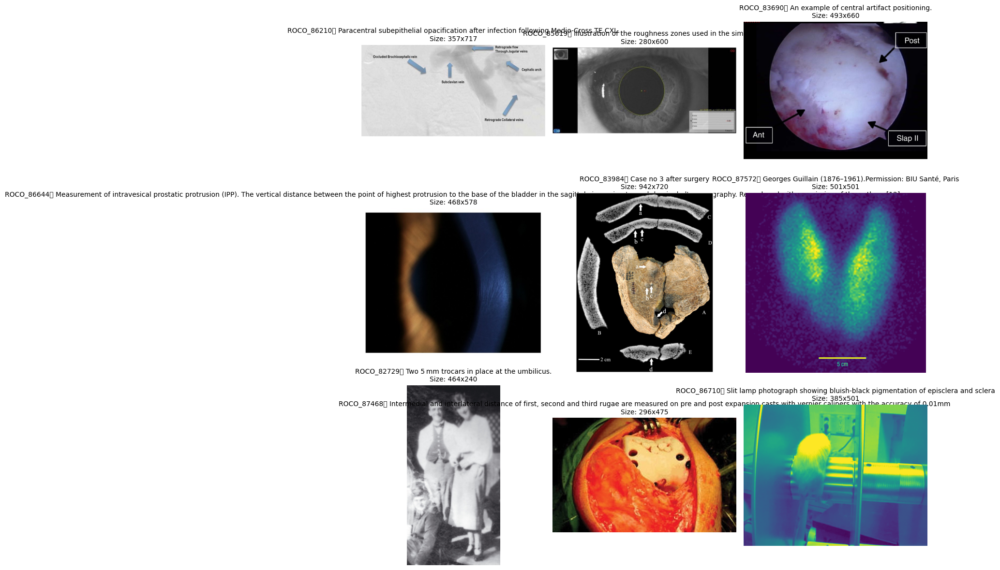

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random


image_dir = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'

try:

    image_paths = [
        os.path.join(image_dir, filename)
        for filename in os.listdir(image_dir)
        if filename.lower().endswith(('.jpg', '.png', '.jpeg'))
    ]


    if os.path.exists(captions_file):
        with open(captions_file, 'r', encoding='utf-8') as f:
            captions = [line.strip() for line in f if line.strip()]
    else:
        raise FileNotFoundError(f"Captions file not found at: {captions_file}")

    min_len = min(len(image_paths), len(captions))
    if min_len == 0:
        raise ValueError("No valid image-caption pairs found.")


    sample_size = min(min_len, 9)  # Display up to 9 images in a 3x3 grid
    sampled_indices = random.sample(range(min_len), sample_size)
    sampled_image_paths = [image_paths[i] for i in sampled_indices]
    sampled_captions = [captions[i] for i in sampled_indices]

    plt.figure(figsize=(12, 12))
    for i, (image_path, caption) in enumerate(zip(sampled_image_paths, sampled_captions)):
        try:
            img = mpimg.imread(image_path)
            plt.subplot(3, 3, i + 1)  # 3 rows, 3 columns
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{caption}\nSize: {img.shape[0]}x{img.shape[1]}", fontsize=10)
        except Exception as e:
            print(f"Error displaying image {image_path}: {e}")

    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")


In [ ]:
image_captions = {}
for img, cap in zip(image_paths, captions):
    if img not in image_captions:
        image_captions[img] = []
    image_captions[img].append(cap)

# Print the image paths and their associated captions
for img, caps in image_captions.items():
    print(f"Image: {img}")
    print("Captions:")
    for caption in caps:
        print(f"- {caption}")
    print("-" * 40)

Streaming output truncated to the last 5000 lines.
Image: /content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_82343.jpg
Captions:
- ROCO_86366	 Fibrous tissue removal at the 12 o’clock position
----------------------------------------
Image: /content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_82342.jpg
Captions:
- ROCO_86368	 Megaselia parnassia female, labrum.
----------------------------------------
Image: /content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_82350.jpg
Captions:
- ROCO_86369	 Complete circumferential detachment of the intramural ureter from the bladder wall
----------------------------------------
Image: /content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_83490.jpg
Captions:
- ROCO_86370	 Acid etching performed for 20 min on 14 and 44
----------------------------------------
Image: /content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_84714.jpg
Captions:
- ROCO_86371	 BOLD fMRI acti

In [ ]:

all_captions = [caption for captions in image_captions.values() for caption in captions]
all_captions[:5]

['ROCO_81826\t Model bone showing the extent of graft insertion',
 'ROCO_81828\t Lip-together smile photograph',
 'ROCO_81829\t Resection of superficial urothelial tissue to dissect the suture material.',
 'ROCO_81830\t External appearance of the neck area revealed tiny pinkish papules.',
 'ROCO_81831\t According to Junius and Kuhnt, the first drawing of disciform macular disease as seen in the eye by low magnification after removal of the anterior segment. It was called Choroido-retinitis in the region of the macula lutea. “Between the papilla and macula lutea is a whitish tract which extends downwards, becoming whiter, and terminates in a sharp point.” This atlas was published in English and German.49']

In [ ]:
all_captions = [caption for captions in image_captions.values() for caption in captions]

print("All Captions:")
for i, caption in enumerate(all_captions, 1):
    print(f"{i}. {caption}")

All Captions:
1. ROCO_81826	 Model bone showing the extent of graft insertion
2. ROCO_81828	 Lip-together smile photograph
3. ROCO_81829	 Resection of superficial urothelial tissue to dissect the suture material.
4. ROCO_81830	 External appearance of the neck area revealed tiny pinkish papules.
5. ROCO_81831	 According to Junius and Kuhnt, the first drawing of disciform macular disease as seen in the eye by low magnification after removal of the anterior segment. It was called Choroido-retinitis in the region of the macula lutea. “Between the papilla and macula lutea is a whitish tract which extends downwards, becoming whiter, and terminates in a sharp point.” This atlas was published in English and German.49
6. ROCO_81832	 Significant decrease in size of pneumocephalus (subarachnoid and interventricular) (case 1).
7. ROCO_81833	 A) Gantzer muscle; B) Located posterior to the anterior interosseous nerve; C) Median nerve.
8. ROCO_81836	 Kayser-Fleischer ring.
9. ROCO_81837	 Insertion of

**CAPTION PREPROCESSING AND FEATURE EXTRACTION**

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
import numpy as np

def preprocess_captions(captions):
    """
    Preprocesses the captions by tokenizing and converting them to sequences.

    Args:
        captions (list of str): List of captions to be preprocessed.

    Returns:
        tuple: Contains the tokenizer, sequences, maximum sequence length,
               vocabulary size, average sequence length, and inverse word index.
    """
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(captions)
    sequences = tokenizer.texts_to_sequences(captions)
    max_length = max(len(seq) for seq in sequences)
    vocab_size = len(tokenizer.word_index) + 1
    avg_length = np.mean([len(seq) for seq in sequences])
    inverse_word_index = {index: word for word, index in tokenizer.word_index.items()}
    return tokenizer, sequences, max_length, vocab_size, avg_length, inverse_word_index


tokenizer, sequences, max_length, vocab_size, avg_length, inverse_word_index = preprocess_captions(all_captions)


print("Preprocessing Results:")
print(f"Total Captions Processed: {len(all_captions)}")
print(f"Vocabulary Size: {vocab_size}")
print(f"Maximum Sequence Length: {max_length}")
print(f"Average Sequence Length: {avg_length:.2f}")
print("\nSample Sequences (first 5):")
for i, seq in enumerate(sequences[:5], 1):
    print(f"{i}. {seq}")

print("\nWord Index (first 10 words):")
for word, index in list(tokenizer.word_index.items())[:10]:
    print(f"{word}: {index}")

print("\nInverse Word Index (first 10 indices):")
for index in range(1, 11):  # Display the first 10 indices
    print(f"{index}: {inverse_word_index.get(index, 'N/A')}")


Preprocessing Results:
Total Captions Processed: 4888
Vocabulary Size: 22103
Maximum Sequence Length: 409
Average Sequence Length: 26.63

Sample Sequences (first 5):
1. [3, 8057, 100, 65, 16, 1, 738, 2, 210, 376]
2. [3, 8058, 1297, 1298, 4109, 44]
3. [3, 8059, 805, 2, 953, 8060, 76, 7, 8061, 1, 211, 525]
4. [3, 8062, 237, 275, 2, 1, 310, 36, 564, 8063, 8064, 4110]
5. [3, 8065, 367, 7, 8066, 4, 8067, 1, 99, 496, 2, 5391, 1193, 660, 21, 106, 5, 1, 62, 14, 305, 318, 23, 349, 2, 1, 29, 137, 124, 17, 3299, 8068, 4111, 5, 1, 58, 2, 1, 2355, 5392, 8069, 1, 2095, 4, 2355, 5392, 9, 6, 1130, 565, 53, 1686, 8070, 8071, 8072, 4, 4112, 5, 6, 2356, 91, 1417, 32, 1542, 17, 1299, 5, 4113, 4, 2731, 2732]

Word Index (first 10 words):
the: 1
of: 2
roco: 3
and: 4
in: 5
a: 6
to: 7
with: 8
is: 9
on: 10

Inverse Word Index (first 10 indices):
1: the
2: of
3: roco
4: and
5: in
6: a
7: to
8: with
9: is
10: on


96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Processing Batches: 100%|██████████| 1/1 [00:07<00:00,  7.39s/it]


Image: ROCO_84554.jpg
Features Shape: (2048,)
Features (first 10 values): [0.3930711  0.05106617 0.7607798  0.27103078 0.02170839 0.8587325
 0.22637385 0.14655253 0.3676466  0.11813602]
----------------------------------------
Image: ROCO_83013.jpg
Features Shape: (2048,)
Features (first 10 values): [0.4066645  0.05277398 0.8292669  0.28201357 0.02515738 0.07342452
 0.03053584 0.7854179  0.5279816  0.34736824]
----------------------------------------
Image: ROCO_82430.jpg
Features Shape: (2048,)
Features (first 10 values): [0.38401195 0.5847957  0.48494366 1.2757293  0.10446773 0.05321921
 0.26670688 0.2875632  0.16059956 0.5667118 ]
----------------------------------------
Image: ROCO_83635.jpg
Features Shape: (2048,)
Features (first 10 values): [0.172023   0.22592212 0.27175573 0.32998297 0.11043827 0.5582058
 0.38217515 0.43792763 0.28827387 0.13365857]
----------------------------------------
Image: ROCO_85198.jpg
Features Shape: (2048,)
Features (first 10 values): [0.34518197 0.63

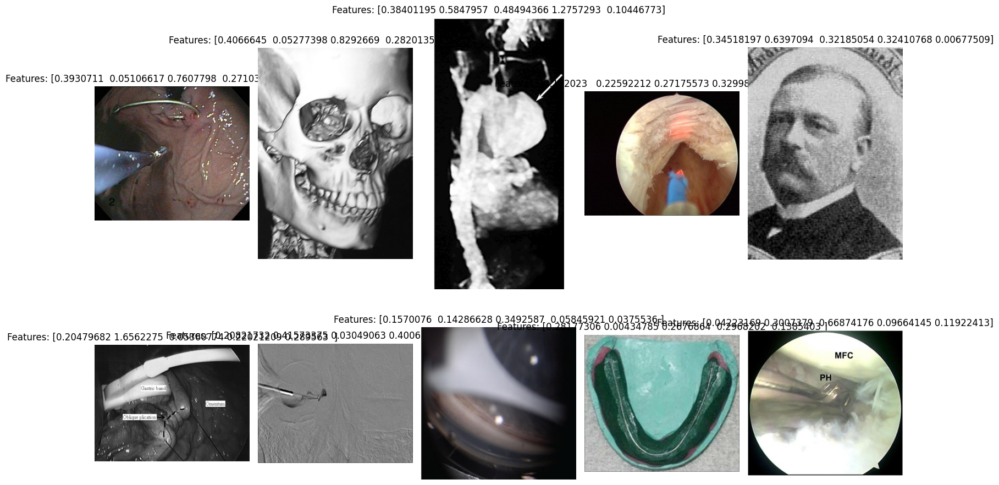

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.models import Model
import random
import os
import tqdm
import matplotlib.pyplot as plt

def extract_features(image_paths, model, batch_size=16):
    """
    Extracts features from a list of image paths using a pre-trained model.

    Args:
        image_paths (list of str): List of paths to images.
        model (tf.keras.Model): Pre-trained Keras model for feature extraction.
        batch_size (int): Number of images to process in each batch.

    Returns:
        dict: Dictionary mapping image paths to their extracted features.
    """
    features = {}
    for batch_start in tqdm.tqdm(range(0, len(image_paths), batch_size), desc="Processing Batches"):
        batch_paths = image_paths[batch_start:batch_start + batch_size]
        batch_imgs = []

        for path in batch_paths:
            try:
                img = tf.keras.preprocessing.image.load_img(path, target_size=(299, 299))
                img = tf.keras.preprocessing.image.img_to_array(img)
                batch_imgs.append(img)
            except Exception as e:
                print(f"Error loading image {path}: {e}")
                continue

        if not batch_imgs:
            continue

        batch_imgs = np.array(batch_imgs)
        batch_imgs = preprocess_input(batch_imgs)
        batch_features = model.predict(batch_imgs, verbose=0)

        for path, feat in zip(batch_paths, batch_features):
            features[path] = feat
    return features


image_model = InceptionV3(weights="imagenet")
image_model = Model(inputs=image_model.input, outputs=image_model.layers[-2].output)


random_image_paths = random.sample(image_paths, 10)


image_features = extract_features(random_image_paths, image_model)

for image_path, features in image_features.items():
    print(f"Image: {os.path.basename(image_path)}")
    print(f"Features Shape: {features.shape}")
    print(f"Features (first 10 values): {features[:10]}")  # Print only first 10 values
    print("-" * 40)


def display_images_with_features(image_paths, features_dict):
    """
    Displays images along with their extracted features.

    Args:
        image_paths (list of str): List of image paths.
        features_dict (dict): Dictionary of features for the images.
    """
    plt.figure(figsize=(15, 10))
    for i, image_path in enumerate(image_paths):
        img = tf.keras.preprocessing.image.load_img(image_path)
        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Features: {features_dict[image_path][:5]}")
    plt.tight_layout()
    plt.show()


display_images_with_features(random_image_paths, image_features)


LSTM MODEL FOR CAPTIONING

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, LSTM, Add, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam


def create_model(vocab_size, max_length, dropout_rate=0.5):
    """
    Creates a model that combines image features and text input.

    Args:
        vocab_size (int): Size of the vocabulary for text input.
        max_length (int): Maximum length of the text input sequences.
        dropout_rate (float): Dropout rate to prevent overfitting.

    Returns:
        Model: Keras model combining image and text inputs.
    """

    image_input = Input(shape=(2048,), name="image_input")
    image_dense = Dense(256, activation="relu", name="image_dense")(image_input)
    image_dense = BatchNormalization(name="image_batch_norm")(image_dense)
    image_dense = Dropout(dropout_rate, name="image_dropout")(image_dense)


    text_input = Input(shape=(max_length,), name="text_input")
    text_embedding = Embedding(vocab_size, 256, mask_zero=True, name="text_embedding")(text_input)
    text_lstm = LSTM(256, return_sequences=True, dropout=dropout_rate, recurrent_dropout=dropout_rate, name="text_lstm")(text_embedding)
    text_lstm = LSTM(256, dropout=dropout_rate, recurrent_dropout=dropout_rate, name="text_lstm_2")(text_lstm)


    decoder = Add(name="add_layer")([image_dense, text_lstm])
    decoder_dense = Dense(256, activation="relu", name="decoder_dense")(decoder)
    decoder_dense = Dropout(dropout_rate, name="decoder_dropout")(decoder_dense)
    output = Dense(vocab_size, activation="softmax", name="output")(decoder_dense)
    model = Model(inputs=[image_input, text_input], outputs=output)
    model.summary()
    return model
model = create_model(vocab_size, max_length)
optimizer = Adam(learning_rate=0.001, clipnorm=1.0)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])


Model: "functional_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 2048)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_input (InputLayer)   │ (None, 409)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ image_dense (Dense)       │ (None, 256)            │        524,544 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_embedding            │ (None, 409, 256)       │      5,658,368 │ text_input[0][0]       │
│ (Embedding)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal (NotEqual)      │ (None, 409)            │              0 │ text_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ image_batch_norm          │ (None, 256)            │          1,024 │ image_dense[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_lstm (LSTM)          │ (None, 409, 256)       │        525,312 │ text_embedding[0][0],  │
│                           │                        │                │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ image_dropout (Dropout)   │ (None, 256)            │              0 │ image_batch_norm[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ text_lstm_2 (LSTM)        │ (None, 256)            │        525,312 │ text_lstm[0][0],       │
│                           │                        │                │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_layer (Add)           │ (None, 256)            │              0 │ image_dropout[0][0],   │
│                           │                        │                │ text_lstm_2[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder_dense (Dense)     │ (None, 256)            │         65,792 │ add_layer[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder_dropout (Dropout) │ (None, 256)            │              0 │ decoder_dense[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (Dense)            │ (None, 22103)          │      5,680,471 │ decoder_dropout[0][0]  │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,980,823 (49.52 MB)

 Trainable params: 12,980,311 (49.52 MB)

 Non-trainable params: 512 (2.00 KB)

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow as tf
import os

def data_generator(image_features, caption_path, tokenizer, max_length, vocab_size):

    with open(caption_path, 'r', encoding='utf-8') as f:
        captions = [line.strip() for line in f]

    while True:
        for i, (image_id, image_feature) in enumerate(image_features.items()):
            if i >= len(captions):
                break
            caption = captions[i]
            seq = tokenizer.texts_to_sequences([caption])[0]
            for j in range(1, len(seq)):
                input_seq = seq[:j]
                output_word = seq[j]

                input_seq_padded = pad_sequences([input_seq], maxlen=max_length, padding='post')[0]

                image_feature_tensor = tf.convert_to_tensor(image_feature[0], dtype=tf.float32)
                input_seq_tensor = tf.convert_to_tensor(input_seq_padded, dtype=tf.float32)
                output_word_tensor = tf.keras.utils.to_categorical([output_word], num_classes=vocab_size)[0]
                output_word_tensor = tf.convert_to_tensor(output_word_tensor, dtype=tf.float32)

                yield (image_feature_tensor, input_seq_tensor), output_word_tensor

def test_generator_with_captions():
    image_features = {
        "image_1": [tf.random.uniform((2048,))],
        "image_2": [tf.random.uniform((2048,))],
    }
    captions_file_path = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'

    if not os.path.exists(captions_file_path):
        print(f"Captions file not found: {captions_file_path}")
        return

    tokenizer = tf.keras.preprocessing.text.Tokenizer()
    with open(captions_file_path, 'r', encoding='utf-8') as f:
        all_captions = [line.strip() for line in f]
    tokenizer.fit_on_texts(all_captions)

    max_length = max(len(caption.split()) for caption in all_captions)
    vocab_size = len(tokenizer.word_index) + 1

    gen = data_generator(image_features, captions_file_path, tokenizer, max_length, vocab_size)

    for _ in range(5):
        (image_feature_tensor, input_seq_tensor), output_word_tensor = next(gen)
        print(f"Image Feature Tensor: {image_feature_tensor.numpy()[:10]}")
        print(f"Input Sequence Tensor: {input_seq_tensor.numpy()}")
        print(f"Output Word Tensor: {output_word_tensor.numpy()}")
        print("-" * 40)
test_generator_with_captions()


Image Feature Tensor: [0.18698645 0.73568785 0.74383175 0.07391131 0.3323412  0.33312798
 0.54073095 0.05128789 0.48046362 0.5342046 ]
Input Sequence Tensor: [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

**FEATURE EXTRACTION USING DIFFERENT PRETRAINED MODEL**

Processing ResNet50...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Block: conv1_conv
Top 5 feature indices (sorted by mean activation): [26 50 37 29 45]
Top 5 feature mean activations: [24.624155 27.851793 29.08448  29.1753   93.4097  ]


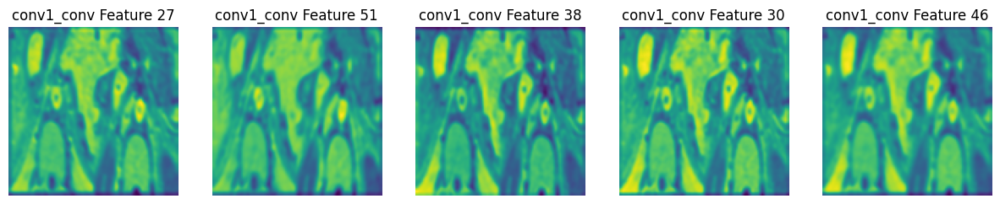

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Top 5 Predictions for resnet:
1. fountain: 74.68%
2. birdhouse: 3.30%
3. viaduct: 2.68%
4. paintbrush: 1.50%
5. picket_fence: 1.22%


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
Block: conv2_block1_out
Top 5 feature indices (sorted by mean activation): [ 37  33 132  43  36]
Top 5 feature mean activations: [2.5490558 2.5648675 2.6427522 2.660669  3.2278318]


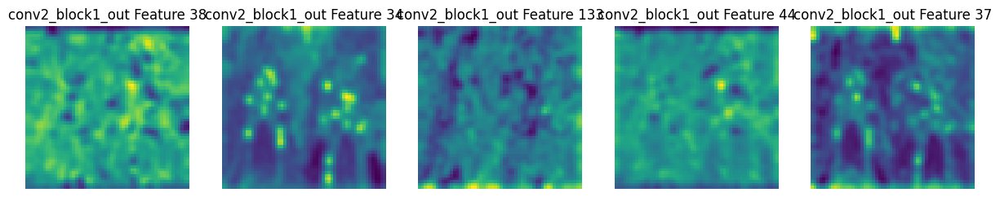

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step

Top 5 Predictions for resnet:
1. fountain: 74.68%
2. birdhouse: 3.30%
3. viaduct: 2.68%
4. paintbrush: 1.50%
5. picket_fence: 1.22%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Block: conv3_block1_out
Top 5 feature indices (sorted by mean activation): [385  78 493 505 260]
Top 5 feature mean activations: [2.671226  2.7158897 2.7704034 2.8262641 2.9111927]


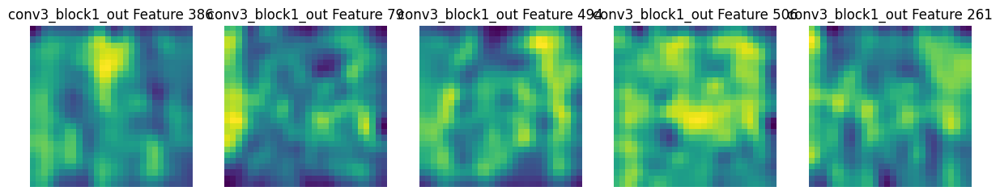

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step

Top 5 Predictions for resnet:
1. fountain: 74.68%
2. birdhouse: 3.30%
3. viaduct: 2.68%
4. paintbrush: 1.50%
5. picket_fence: 1.22%
Processing VGG16...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
Block: block1_conv2
Top 5 feature indices (sorted by mean activation): [45  4 52 27 42]
Top 5 feature mean activations: [169.33817 173.71024 175.33865 182.29752 231.106  ]


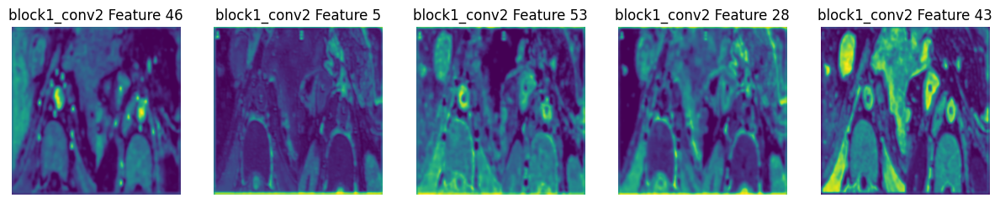

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step

Top 5 Predictions for vgg16:
1. birdhouse: 26.23%
2. picket_fence: 20.75%
3. church: 4.68%
4. monastery: 4.42%
5. chime: 4.25%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
Block: block2_conv2
Top 5 feature indices (sorted by mean activation): [ 30  52 125  33 100]
Top 5 feature mean activations: [ 419.79504  430.11227  465.16837  826.1588  1175.0975 ]


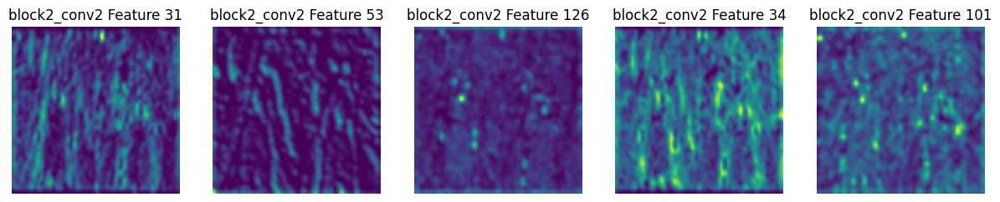

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step

Top 5 Predictions for vgg16:
1. birdhouse: 26.23%
2. picket_fence: 20.75%
3. church: 4.68%
4. monastery: 4.42%
5. chime: 4.25%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
Block: block3_conv3
Top 5 feature indices (sorted by mean activation): [ 60 149 147 237 183]
Top 5 feature mean activations: [ 785.6661   810.72455 1064.0052  1082.1157  1147.4181 ]


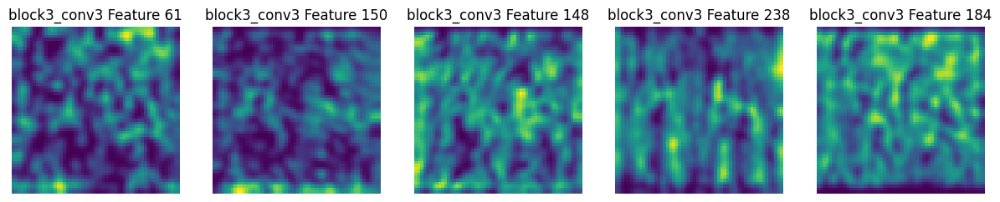

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step

Top 5 Predictions for vgg16:
1. birdhouse: 26.23%
2. picket_fence: 20.75%
3. church: 4.68%
4. monastery: 4.42%
5. chime: 4.25%
Processing VGG19...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
Block: block1_conv2
Top 5 feature indices (sorted by mean activation): [28  2 45 39 42]
Top 5 feature mean activations: [145.55421 159.4719  201.54726 239.26439 288.94083]


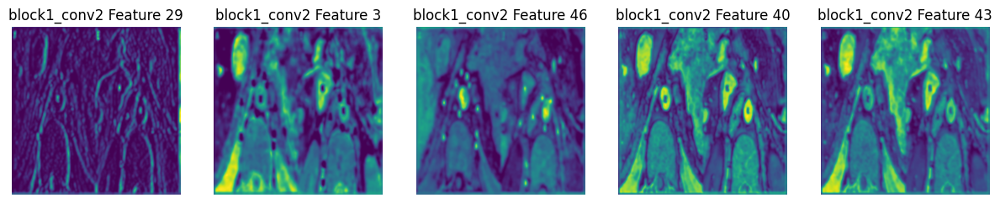

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step

Top 5 Predictions for vgg19:
1. birdhouse: 28.30%
2. wooden_spoon: 10.11%
3. picket_fence: 6.88%
4. ski: 6.43%
5. totem_pole: 4.23%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
Block: block2_conv2
Top 5 feature indices (sorted by mean activation): [ 24 125  30  33 100]
Top 5 feature mean activations: [246.035   250.95308 301.81964 475.77612 604.1782 ]


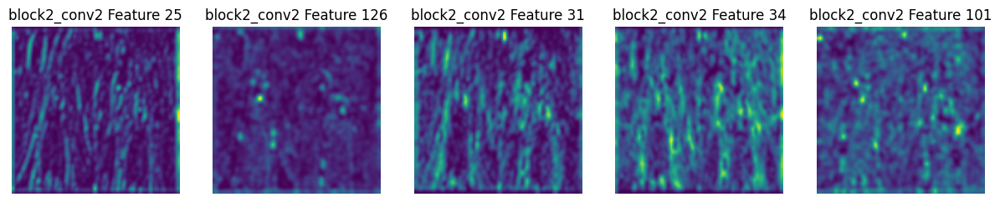

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step

Top 5 Predictions for vgg19:
1. birdhouse: 28.30%
2. wooden_spoon: 10.11%
3. picket_fence: 6.88%
4. ski: 6.43%
5. totem_pole: 4.23%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
Block: block3_conv4
Top 5 feature indices (sorted by mean activation): [152  25 194  63 171]
Top 5 feature mean activations: [1799.0137 1978.7717 2092.003  2108.9067 2234.054 ]


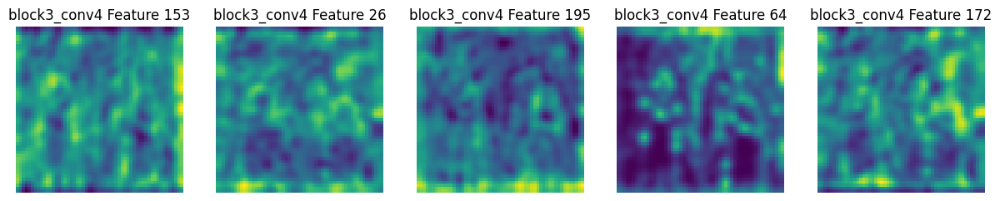

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Top 5 Predictions for vgg19:
1. birdhouse: 28.30%
2. wooden_spoon: 10.11%
3. picket_fence: 6.88%
4. ski: 6.43%
5. totem_pole: 4.23%


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, VGG16, VGG19
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import cv2
import os

def preprocess_image(image_path, model_type):
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image file not found: {image_path}")

    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    if model_type == 'resnet':
        return resnet_preprocess(img_array)
    elif model_type == 'vgg16':
        return vgg16_preprocess(img_array)
    elif model_type == 'vgg19':
        return vgg19_preprocess(img_array)
    else:
        return img_array

def extract_block_features(image_path, model, block_name, model_type):
    preprocessed_img = preprocess_image(image_path, model_type)
    intermediate_layer_model = tf.keras.Model(
        inputs=model.input, outputs=model.get_layer(block_name).output
    )
    feature_map = intermediate_layer_model.predict(preprocessed_img)
    return feature_map

def visualize_block_features(feature_map, block_name, num_features=5):
    feature_map = feature_map.squeeze()
    feature_map_mean = np.mean(feature_map, axis=(0, 1))
    top_features_idx = np.argsort(feature_map_mean)[-num_features:]

    print(f"Block: {block_name}")
    print("Top 5 feature indices (sorted by mean activation):", top_features_idx)
    print("Top 5 feature mean activations:", feature_map_mean[top_features_idx])

    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(top_features_idx):
        plt.subplot(1, num_features, i + 1)
        plt.imshow(cv2.GaussianBlur(feature_map[:, :, idx], (5, 5), 0), cmap='viridis')
        plt.title(f'{block_name} Feature {idx + 1}')
        plt.axis('off')
    plt.show()

def get_top_5_predictions(image_path, model, model_type):
    preprocessed_img = preprocess_image(image_path, model_type)
    preds = model.predict(preprocessed_img)
    decoded_preds = decode_predictions(preds, top=5)[0]

    print(f"\nTop 5 Predictions for {model_type}:")
    for i, (imagenet_id, label, prob) in enumerate(decoded_preds):
        print(f"{i + 1}. {label}: {prob * 100:.2f}%")

resnet_model = ResNet50(weights='imagenet', include_top=True)
vgg16_model = VGG16(weights='imagenet', include_top=True)
vgg19_model = VGG19(weights='imagenet', include_top=True)

image_path = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_87946.jpg'

blocks = {
    'resnet': ['conv1_conv', 'conv2_block1_out', 'conv3_block1_out'],
    'vgg16': ['block1_conv2', 'block2_conv2', 'block3_conv3'],
    'vgg19': ['block1_conv2', 'block2_conv2', 'block3_conv4']
}


print("Processing ResNet50...")
for block in blocks['resnet']:
    resnet_features = extract_block_features(image_path, resnet_model, block, 'resnet')
    visualize_block_features(resnet_features, block)
    get_top_5_predictions(image_path, resnet_model, 'resnet')

# VGG16
print("Processing VGG16...")
for block in blocks['vgg16']:
    vgg16_features = extract_block_features(image_path, vgg16_model, block, 'vgg16')
    visualize_block_features(vgg16_features, block)
    get_top_5_predictions(image_path, vgg16_model, 'vgg16')

# VGG19
print("Processing VGG19...")
for block in blocks['vgg19']:
    vgg19_features = extract_block_features(image_path, vgg19_model, block, 'vgg19')
    visualize_block_features(vgg19_features, block)
    get_top_5_predictions(image_path, vgg19_model, 'vgg19')


CAPTION GENERATION..

In [ ]:
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop
import matplotlib.pyplot as plt

file_path = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'


with open(file_path, 'r') as file:
    all_captions = file.readlines()

corpus = [caption.strip() for caption in all_captions[:10] if caption.strip()]

image_dir = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'

image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith(('.jpg', '.png'))]

with open(captions_file, 'r') as f:
    captions = [line.strip() for line in f]

min_len = min(len(image_paths), len(captions))
image_paths = image_paths[:min_len]
captions = captions[:min_len]

tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i + 1]
        sequences.append(ngram_sequence)

max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

hyperparameters = {
    "embedding_dim": 100,
    "lstm_units": 128,
    "dropout_rate": 0.3,
    "optimizer": 'adam',
    "learning_rate": 0.001
}

def build_model(embedding_dim=100, lstm_units=128, dropout_rate=0.3, optimizer='adam', learning_rate=0.001):
    if optimizer == 'adam':
        selected_optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        selected_optimizer = RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam' or 'rmsprop'.")

    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len - 1),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=selected_optimizer, metrics=['accuracy'])
    return model

model = build_model(
    embedding_dim=hyperparameters['embedding_dim'],
    lstm_units=hyperparameters['lstm_units'],
    dropout_rate=hyperparameters['dropout_rate'],
    optimizer=hyperparameters['optimizer'],
    learning_rate=hyperparameters['learning_rate']
)

print("\nTraining Model:")
history = model.fit(X, y, epochs=100, verbose=1, batch_size=32)

def generate_caption(image_caption, max_words=8):
    seed_text = image_caption.split()[0]
    generated_text = seed_text

    for _ in range(max_words):
        token_list = tokenizer.texts_to_sequences([generated_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len - 1, padding="pre")
        predicted = np.argmax(model.predict(token_list, verbose=0), axis=-1)

        output_word = next((word for word, index in tokenizer.word_index.items() if index == predicted), None)
        if output_word:
            generated_text += " " + output_word

        if generated_text in corpus:
            break

    return generated_text.strip()

original_caption = captions[5]
generated_caption = generate_caption(original_caption)
print(f"\nOriginal Caption: {original_caption}")
print(f"Generated Caption: {generated_caption}")


Vocabulary size: 187

Training Model:
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - accuracy: 0.0245 - loss: 5.2307
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - accuracy: 0.0757 - loss: 5.2080
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - accuracy: 0.0858 - loss: 5.0750
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - accuracy: 0.0928 - loss: 4.9405
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - accuracy: 0.0917 - loss: 4.9360
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - accuracy: 0.1168 - loss: 4.8285
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - accuracy: 0.0761 - loss: 4.8399
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - accuracy: 0.0963 - loss: 4.7061
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - accuracy: 0.1088 - loss: 4.7009
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - accuracy: 0.1114 - loss: 4.6425
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.0943 - loss: 4.6154
Epoch 12/100
9/9 ━━━━━━━━

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop

file_path ='/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'

with open(file_path, 'r') as file:
    all_captions = file.readlines()

corpus = [caption.strip() for caption in all_captions[:10] if caption.strip()]

tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")

sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i+1]
        sequences.append(ngram_sequence)

max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

def build_model(embedding_dim=50, lstm_units=100, dropout_rate=0.2, optimizer='adam', learning_rate=0.001):
    if optimizer == 'adam':
        selected_optimizer = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        selected_optimizer = RMSprop(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer. Use 'adam' or 'rmsprop'.")

    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len-1),
        LSTM(lstm_units, return_sequences=False),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=selected_optimizer, metrics=['accuracy'])
    return model

hyperparameters = {
    "embedding_dim": 100,
    "lstm_units": 128,
    "dropout_rate": 0.3,
    "optimizer": 'adam',
    "learning_rate": 0.001
}

print("\nHyperparameters:")
for key, value in hyperparameters.items():
    print(f"{key}: {value}")

model = build_model(
    embedding_dim=hyperparameters['embedding_dim'],
    lstm_units=hyperparameters['lstm_units'],
    dropout_rate=hyperparameters['dropout_rate'],
    optimizer=hyperparameters['optimizer'],
    learning_rate=hyperparameters['learning_rate']
)

print("\nTraining Model:")
history = model.fit(X, y, epochs=100, verbose=1, batch_size=32)

final_accuracy = history.history['accuracy'][-1]
print(f"\nFinal Accuracy after 100 epochs: {final_accuracy}")

Vocabulary size: 187

Hyperparameters:
embedding_dim: 100
lstm_units: 128
dropout_rate: 0.3
optimizer: adam
learning_rate: 0.001

Training Model:
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 487ms/step - accuracy: 0.0365 - loss: 5.2300
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.0873 - loss: 5.1873
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step - accuracy: 0.0885 - loss: 4.9712
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - accuracy: 0.0892 - loss: 5.0051
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - accuracy: 0.1021 - loss: 4.8913
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - accuracy: 0.0912 - loss: 4.8765
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - accuracy: 0.0883 - loss: 4.8971
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - accuracy: 0.0947 - loss: 4.8625
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.0847 - loss: 4.8094
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - accuracy: 0.0725 - loss: 4.8154
Epo

**HYPERPARAMETER TUNING**

In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 3.8 MB/s eta 0:00:00


[I 2024-12-26 10:09:33,099] A new study created in memory with name: no-name-5c6b5e26-ef51-44ff-ab7a-67f37f040f2e


Vocabulary size: 187


<ipython-input-90-521f4c6facf8>:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform("dropout_rate", 0.2, 0.5)
<ipython-input-90-521f4c6facf8>:55: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(
[I 2024-12-26 10:09:37,769] Trial 0 finished with value: 0.01886792480945587 and parameters: {'embedding_dim': 100, 'lstm_units': 32, 'dropout_rate': 0.2986045282752893, 'optimizer': 'adam', 'learning_rate': 0.0005114190124437709}. Bes


Tuned hyperparameters: 
embedding_dim: 100
lstm_units: 64
dropout_rate: 0.43184353173630335
optimizer: rmsprop
learning_rate: 0.00956668026225006

Tuned validation accuracy:  0.056603774428367615
Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.0508 - loss: 5.2281 - val_accuracy: 0.0189 - val_loss: 5.2787
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.1071 - loss: 4.9895 - val_accuracy: 0.0189 - val_loss: 5.6575
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.1140 - loss: 4.6831 - val_accuracy: 0.0189 - val_loss: 5.9127
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.1132 - loss: 4.4679 - val_accuracy: 0.0000e+00 - val_loss: 6.4731


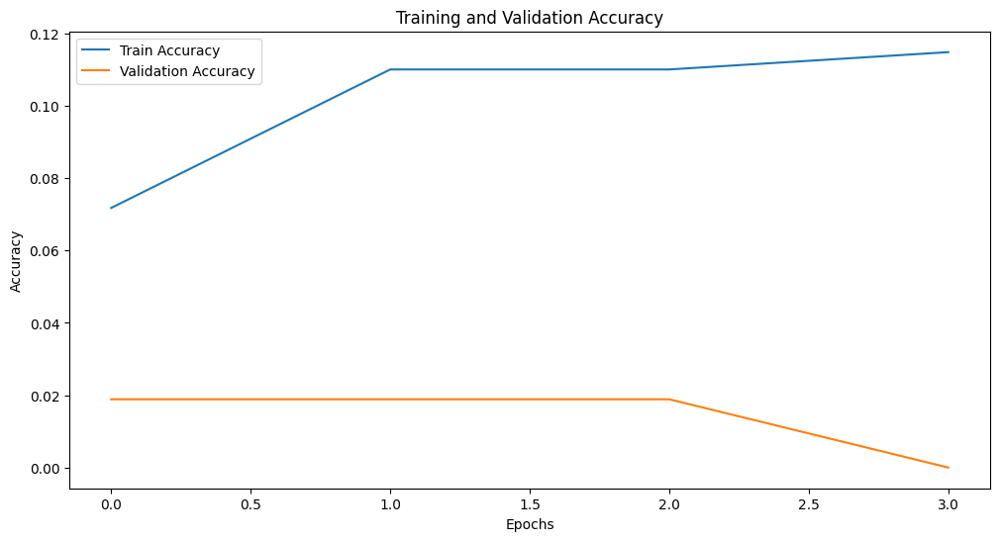

In [ ]:
import numpy as np
import os
import optuna
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import matplotlib.pyplot as plt

file_path = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'
with open(file_path, 'r') as file:
    all_captions = file.readlines()

corpus = [caption.strip() for caption in all_captions[:10] if caption.strip()]

tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary size: {vocab_size}")
s
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i + 1]
        sequences.append(ngram_sequence)

max_sequence_len = max(len(seq) for seq in sequences)
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

X = sequences[:, :-1]
y = sequences[:, -1]
y = to_categorical(y, num_classes=vocab_size)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

def objective(trial):
    embedding_dim = trial.suggest_categorical("embedding_dim", [50, 100, 150])
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128])
    dropout_rate = trial.suggest_uniform("dropout_rate", 0.2, 0.5)
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "rmsprop"])
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)

    if optimizer_name == "adam":
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_name == "rmsprop":
        optimizer = RMSprop(learning_rate=learning_rate)

    model = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_sequence_len - 1),
        LSTM(lstm_units),
        Dropout(dropout_rate),
        Dense(vocab_size, activation="softmax")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])

    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=10,
        batch_size=32,
        verbose=0,
        callbacks=[early_stopping]
    )

    val_accuracy = history.history['val_accuracy'][-1]
    return val_accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)

print("\nTuned hyperparameters: ")
for key, value in study.best_params.items():
    print(f"{key}: {value}")

print("\nTuned validation accuracy: ", study.best_value)

best_params = study.best_params
model = Sequential([
    Embedding(vocab_size, best_params["embedding_dim"], input_length=max_sequence_len - 1),
    LSTM(best_params["lstm_units"]),
    Dropout(best_params["dropout_rate"]),
    Dense(vocab_size, activation="softmax")
])
model.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=best_params["learning_rate"]), metrics=['accuracy'])

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=32,
    verbose=1,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [ ]:
!pip install rouge-score

from nltk.translate.bleu_score import sentence_bleu
from rouge_score import rouge_scorer

def evaluate_captions(original_caption, generated_caption):
    bleu_score = sentence_bleu([original_caption.split()], generated_caption.split())
    print(f"\nBLEU Score: {bleu_score:.4f}")

    scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
    rouge_score = scorer.score(original_caption, generated_caption)

    print(f"ROUGE Score (ROUGE-1): {rouge_score['rouge1'].fmeasure:.4f}")
    print(f"ROUGE Score (ROUGE-L): {rouge_score['rougeL'].fmeasure:.4f}")

original_caption = "A cat is sitting on a windowsill."
generated_caption = "A cat sits on the windowsill."

evaluate_captions(original_caption, generated_caption)


  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24935 sha256=5ea4d091e45408b2faf8ce1abe124e0f058f262859d59d05e5e84d3466e2267c
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score

BLEU Score: 0.0000
ROUGE Score (ROUGE-1): 0.7692
ROUGE Score (ROUGE-L): 0.7692


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BLEU SCORE


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


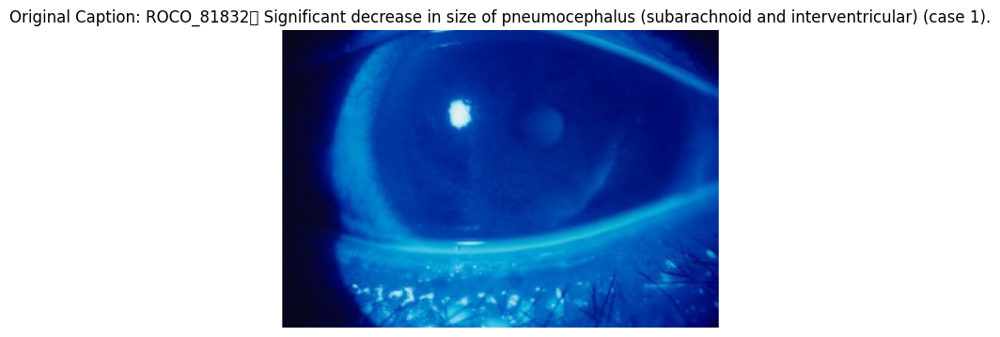

Image Path: /content/drive/MyDrive/ROCO_data/data/train/non-radiology/images/ROCO_86020.jpg
Original Caption: ROCO_81832	 Significant decrease in size of pneumocephalus (subarachnoid and interventricular) (case 1).
Vocabulary Size: 22103
Total Sequences: 125269
Max Sequence Length: 409
Sample Sequence: [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0  

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

image_dir = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/images'
captions_file = '/content/drive/MyDrive/ROCO_data/data/train/non-radiology/captions.txt'

image_paths = [
    os.path.join(image_dir, filename)
    for filename in os.listdir(image_dir)
    if filename.endswith(('.jpg', '.png'))
]

with open(captions_file, 'r') as f:
    captions = [line.strip() for line in f]

min_len = min(len(image_paths), len(captions))
image_paths = image_paths[:min_len]
captions = captions[:min_len]

def display_image_with_caption(image_path, caption):
    img = mpimg.imread(image_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Original Caption: {caption}", fontsize=12)
    plt.show()

selected_image_index = 5
selected_image_path = image_paths[selected_image_index]
original_caption = captions[selected_image_index]

display_image_with_caption(selected_image_path, original_caption)

print(f"Image Path: {selected_image_path}")
print(f"Original Caption: {original_caption}")

corpus = captions
tokenizer = Tokenizer()
tokenizer.fit_on_texts(corpus)
vocab_size = len(tokenizer.word_index) + 1
print(f"Vocabulary Size: {vocab_size}")

# Create sequences for training
sequences = []
for line in corpus:
    token_list = tokenizer.texts_to_sequences([line])[0]
    for i in range(1, len(token_list)):
        ngram_sequence = token_list[:i + 1]
        sequences.append(ngram_sequence)

# Pad sequences to ensure uniform length
max_sequence_len = max([len(seq) for seq in sequences])
sequences = pad_sequences(sequences, maxlen=max_sequence_len, padding="pre")

# Print sequences and their shapes for verification
print(f"Total Sequences: {len(sequences)}")
print(f"Max Sequence Length: {max_sequence_len}")
print(f"Sample Sequence: {sequences[0]}")


In [ ]:
from nltk.translate.bleu_score import sentence_bleu
from rouge_score import rouge_scorer

def evaluate_captions(original_caption, generated_caption):
    if not original_caption or not generated_caption:
        print("Error: One of the captions is empty.")
        return

    bleu_score = sentence_bleu([original_caption.split()], generated_caption.split())
    print(f"\nBLEU Score: {bleu_score:.4f}")  # Format to 4 decimal places

    scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
    rouge_score = scorer.score(generated_caption, original_caption)

    print(f"ROUGE Score:")
    print(f"  ROUGE-1: {rouge_score['rouge1'].fmeasure:.4f}")
    print(f"  ROUGE-L: {rouge_score['rougeL'].fmeasure:.4f}")

original_caption = "A dog is playing with a ball."
generated_caption = "A dog plays with a ball."

evaluate_captions(original_caption, generated_caption)



BLEU Score: 0.0000
ROUGE Score:
  ROUGE-1: 0.9231
  ROUGE-L: 0.9231
